# ***LOAD AUDIO WAV***

MFCC features for dog_barking_1.wav:
[[-4.96714874e+02 -4.67690613e+02 -4.28978333e+02 ... -4.23697205e+02
  -4.33882935e+02 -4.52944519e+02]
 [ 3.97429161e+01  4.92438049e+01  8.48358002e+01 ...  7.79963379e+01
   7.56068573e+01  6.47146530e+01]
 [ 1.94055500e+01  9.71362495e+00  5.46050167e+00 ...  6.93443203e+00
   1.39749088e+01  2.64402428e+01]
 ...
 [ 8.52981150e-01  3.32291293e+00  3.97803783e+00 ... -8.72934532e+00
  -1.04339695e+01 -8.44312859e+00]
 [-2.66525531e+00 -5.02725124e+00 -6.82625675e+00 ... -1.18078928e+01
  -7.48303556e+00 -8.44626522e+00]
 [-2.37800264e+00 -1.11642152e-01 -3.71754551e+00 ... -1.12600422e+01
  -3.13475275e+00  3.63015294e-01]]
Dimension of MFCC features: (20, 346)

MFCC features for dog_barking_2.wav:
[[-4.23302063e+02 -4.12439758e+02 -4.20497192e+02 ... -2.79908081e+02
  -3.00213562e+02 -3.35194946e+02]
 [ 1.27716949e+02  1.31196274e+02  1.27910446e+02 ...  1.69125397e+02
   1.60649734e+02  1.51840332e+02]
 [ 2.19544220e+01  1.97516899e+01  2.4656

Playing dog_barking_2.wav...


Playing dog_barking_4.wav...


Playing dog_barking_5.wav...


Playing dog_barking_6.wav...


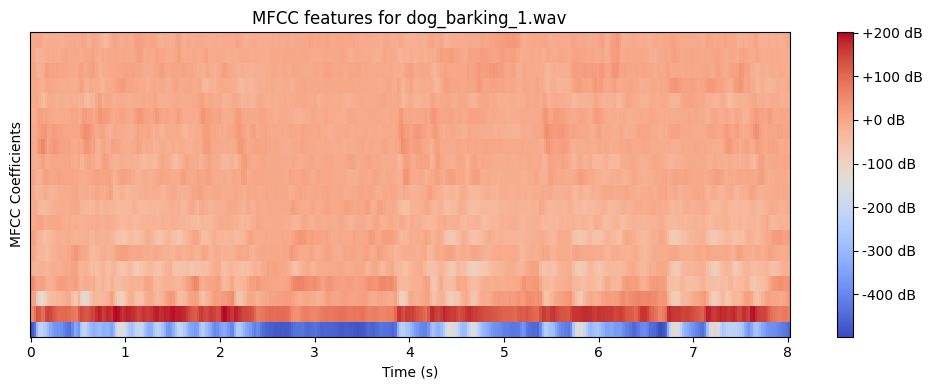

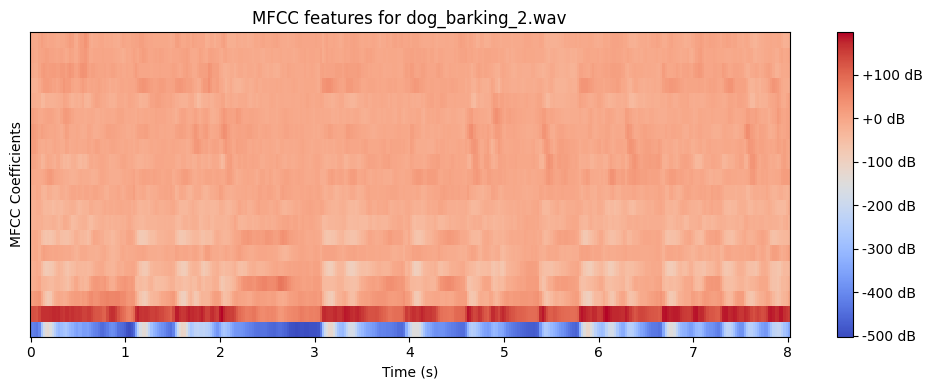

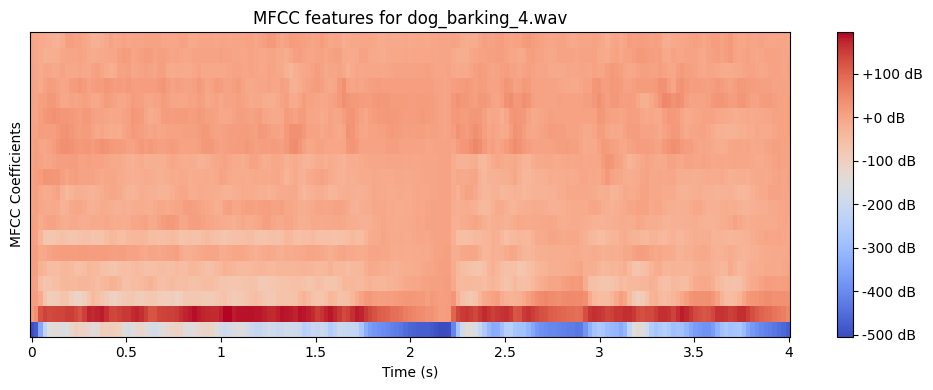

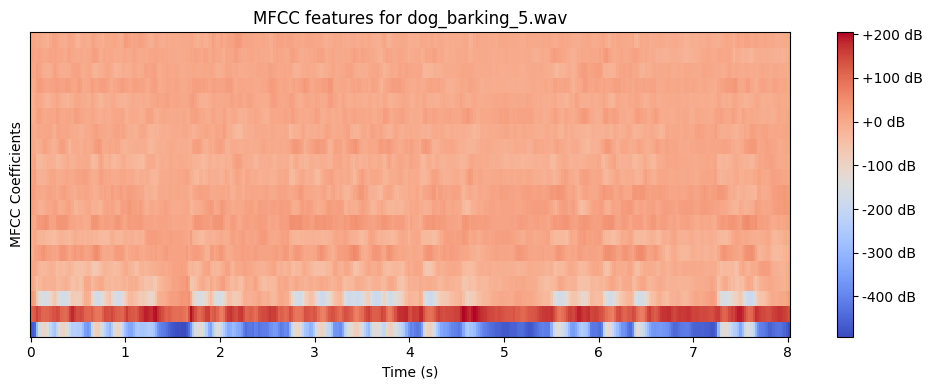

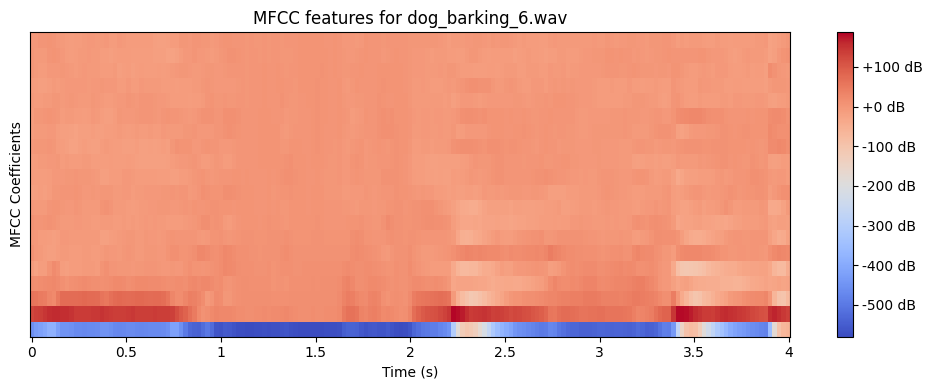

Playing dog_barking_1.wav (5 seconds)...


Playing dog_barking_2.wav (5 seconds)...


Playing dog_barking_4.wav (5 seconds)...


Playing dog_barking_5.wav (5 seconds)...


Playing dog_barking_6.wav (5 seconds)...


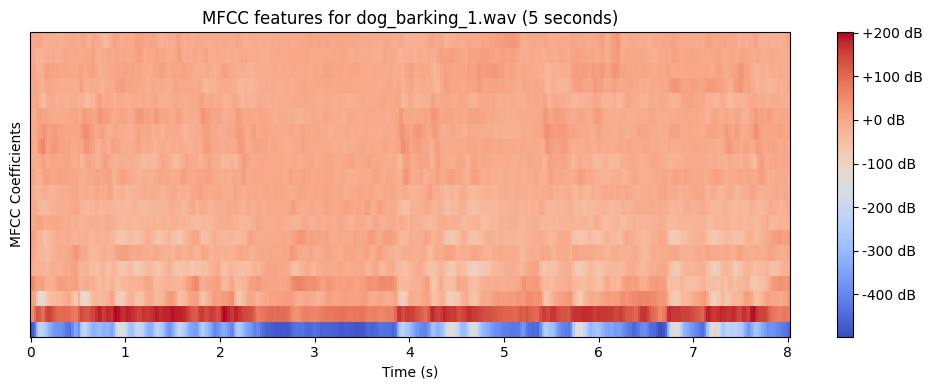

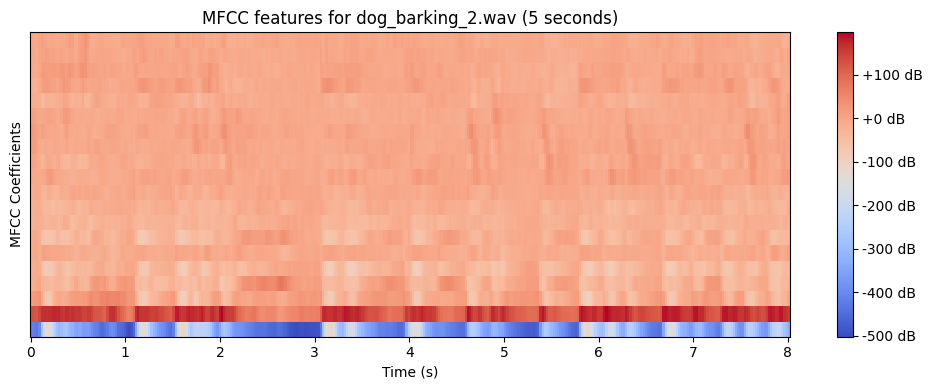

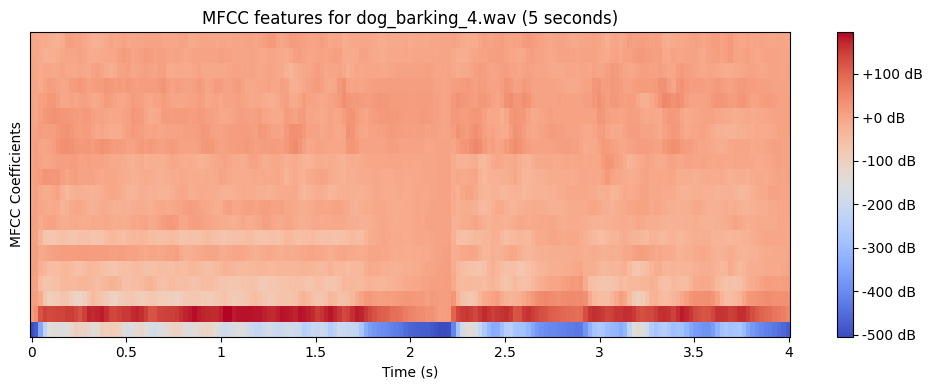

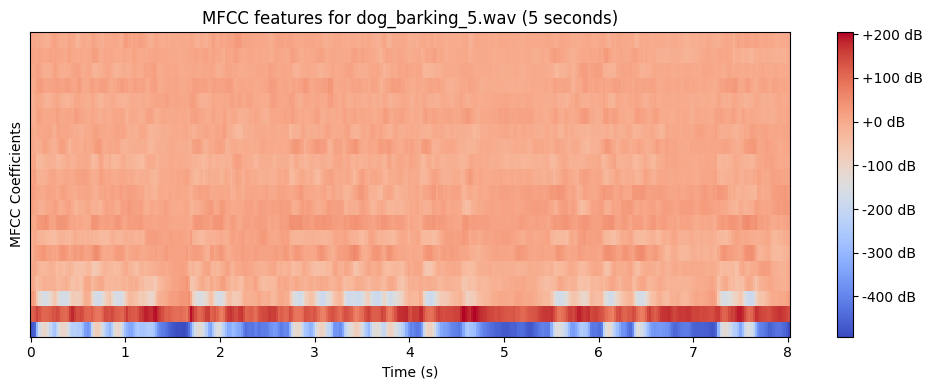

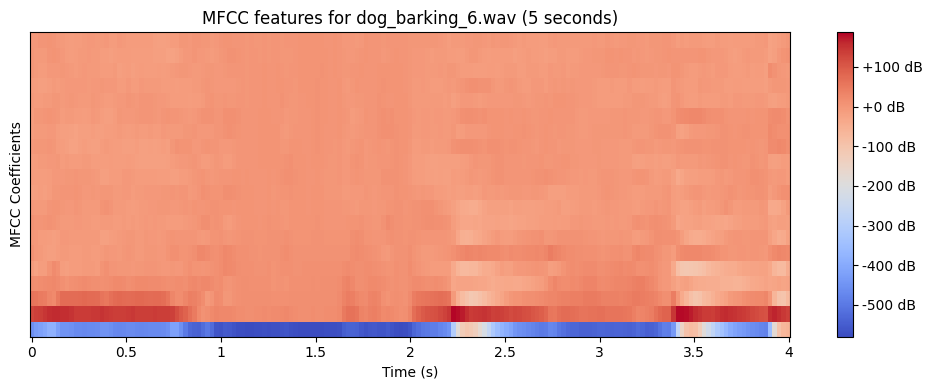

Playing dog_barking_1.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_2.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_4.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_5.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_6.wav (5 seconds)...


Number of frames: 99



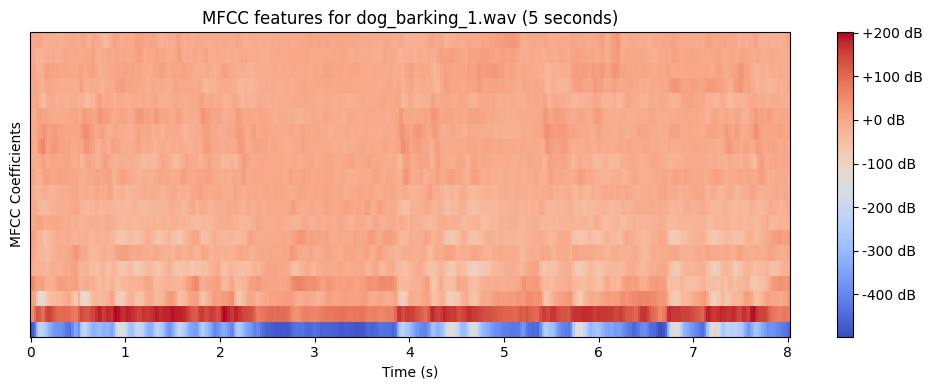

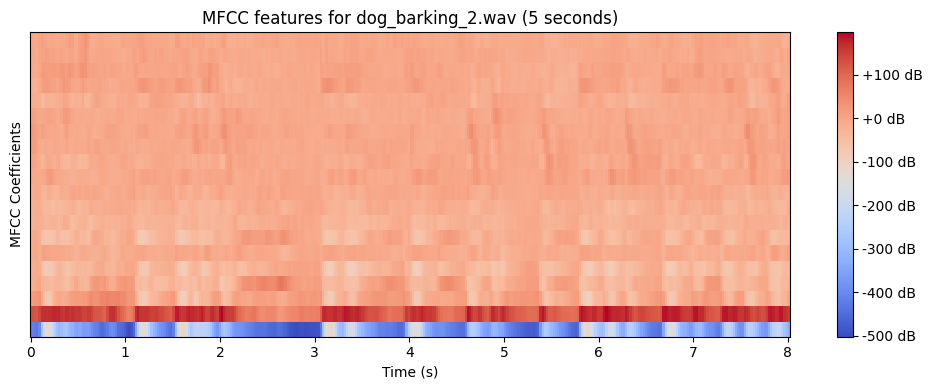

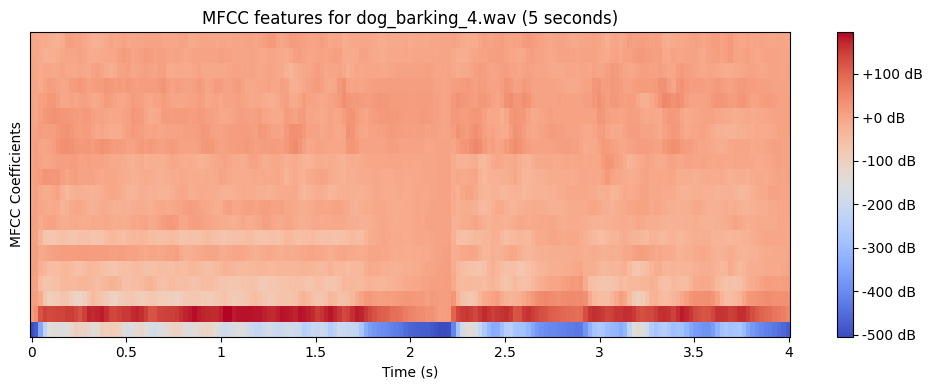

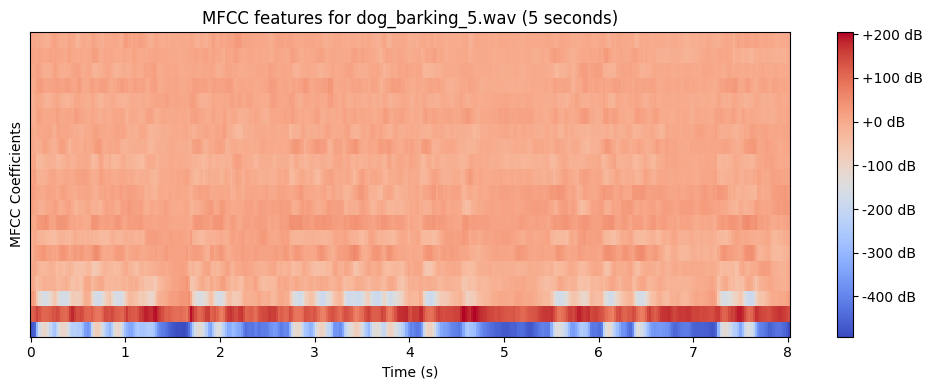

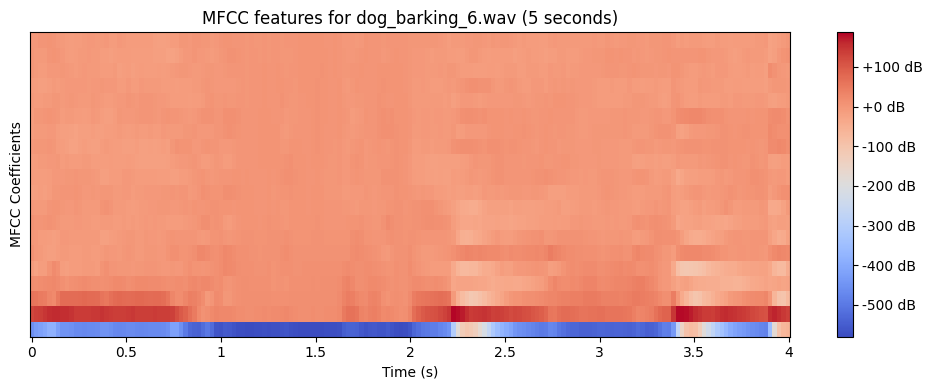

In [86]:
import librosa
import numpy as np

# Function to extract MFCC features for a given audio file
def extract_mfcc(audio_file, segment_duration=4):
    audio, sr = librosa.load(audio_file)

    # Check if the audio is shorter than the segment duration
    if len(audio) < segment_duration * sr:
        print(f"Warning: Audio file '{audio_file}' is too short for the specified segment duration. Skipping...")
        return None

    # Segment the audio using librosa.util.frame
    segment_length = segment_duration * sr
    audio_segments = librosa.util.frame(audio, frame_length=segment_length, hop_length=segment_length)

    mfcc_segments = []
    for segment in audio_segments.T:
        mfcc = librosa.feature.mfcc(y=segment, sr=sr)
        mfcc_segments.append(mfcc)

    mfcc_combined = np.concatenate(mfcc_segments, axis=1)
    return mfcc_combined

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav','dog_barking_5.wav','dog_barking_6.wav']

# Extract MFCC features for each audio file
all_mfcc_features = []
for audio_file in audio_files:
    mfcc_features = extract_mfcc(audio_file)
    if mfcc_features is not None:
        all_mfcc_features.append(mfcc_features)

# Print the MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        print(f'MFCC features for {audio_file}:')
        print(all_mfcc_features[i])
        print('Dimension of MFCC features:', all_mfcc_features[i].shape)
        print()
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Function to extract MFCC features for a given audio file (your existing function)

# ... (the rest of your existing code) ...


import librosa
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

# Function to extract MFCC features for a given audio file (your existing function)

# ... (the rest of your existing code) ...

# Play the original audio files
for audio_file in audio_files:
    audio, sr = librosa.load(audio_file)
    print(f"Playing {audio_file}...")
    display(Audio(audio, rate=sr))

# Visualize MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        plt.figure(figsize=(10, 4))
        plt.title(f"MFCC features for {audio_file}")
        librosa.display.specshow(all_mfcc_features[i], x_axis='time')
        plt.colorbar(format='%+2.0f dB')
        plt.xlabel("Time (s)")
        plt.ylabel("MFCC Coefficients")
        plt.tight_layout()
        plt.show()

# Function to cut audio to a specific duration
def cut_audio(audio, sr, duration=5):
    target_length = sr * duration
    if len(audio) > target_length:
        # Trim audio to the desired duration
        trimmed_audio, _ = librosa.effects.trim(audio, top_db=20)
        if len(trimmed_audio) > target_length:
            return trimmed_audio[:target_length]
        else:
            # If trimmed audio is still shorter than the target duration, pad it with zeros
            return np.pad(trimmed_audio, (0, target_length - len(trimmed_audio)), mode='constant')
    elif len(audio) < target_length:
        # If audio is shorter than the target duration, pad it with zeros
        return np.pad(audio, (0, target_length - len(audio)), mode='constant')
    else:
        return audio

# Cut and play the original audio files (5 seconds each)
for audio_file in audio_files:
    audio, sr = librosa.load(audio_file)
    audio_5s = cut_audio(audio, sr, duration=5)
    print(f"Playing {audio_file} (5 seconds)...")
    display(Audio(audio_5s, rate=sr))

# Visualize MFCC features for each 5-second audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        audio, sr = librosa.load(audio_file)
        audio_5s = cut_audio(audio, sr, duration=5)
        plt.figure(figsize=(10, 4))
        plt.title(f"MFCC features for {audio_file} (5 seconds)")
        librosa.display.specshow(all_mfcc_features[i], x_axis='time', sr=sr)
        plt.colorbar(format='%+2.0f dB')
        plt.xlabel("Time (s)")
        plt.ylabel("MFCC Coefficients")
        plt.tight_layout()
        plt.show()



# Function to perform frame blocking on an audio signal
def frame_blocking(signal, frame_duration=0.1, hop_duration=0.05, sample_rate=22050):
    frame_length = int(frame_duration * sample_rate)
    hop_length = int(hop_duration * sample_rate)
    frames = []
    for i in range(0, len(signal) - frame_length + 1, hop_length):
        frames.append(signal[i:i + frame_length])
    return np.array(frames)

# Cut and play the original audio files (5 seconds each)
for audio_file in audio_files:
    audio, sr = librosa.load(audio_file)
    audio_5s = cut_audio(audio, sr, duration=5)
    print(f"Playing {audio_file} (5 seconds)...")
    display(Audio(audio_5s, rate=sr))

    # Perform frame blocking on the 5-second audio
    frame_duration = 0.1  # 100 ms frames
    hop_duration = 0.05    # 50 ms hop
    frames = frame_blocking(audio_5s, frame_duration, hop_duration, sr)
    print(f"Number of frames: {len(frames)}")
    print()

# Visualize MFCC features for each 5-second audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        audio, sr = librosa.load(audio_file)
        audio_5s = cut_audio(audio, sr, duration=5)

        # Perform frame blocking on the 5-second audio
        frame_duration = 0.1  # 100 ms frames
        hop_duration = 0.05    # 50 ms hop
        frames = frame_blocking(audio_5s, frame_duration, hop_duration, sr)

        plt.figure(figsize=(10, 4))
        plt.title(f"MFCC features for {audio_file} (5 seconds)")
        librosa.display.specshow(all_mfcc_features[i], x_axis='time', sr=sr)
        plt.colorbar(format='%+2.0f dB')
        plt.xlabel("Time (s)")
        plt.ylabel("MFCC Coefficients")
        plt.tight_layout()
        plt.show()


# **SETELAH DIPOTONG MENJADI SAMA DURASINYA (5DETIK)**

Playing dog_barking_1.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_2.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_4.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_5.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_6.wav (5 seconds)...


Number of frames: 99

Playing dog_barking_1.wav (5 seconds)...


Number of frames: 99
Data values of frames for dog_barking_1.wav:
Frame 1:
[0.00497831 0.00435944 0.00454956 ... 0.01649661 0.02704143 0.03505701]

Frame 2:
[0.11812957 0.19406253 0.20239696 ... 0.01354236 0.01420181 0.01249265]

Frame 3:
[ 0.03505701  0.03807706  0.03485571 ...  0.0016843   0.0007212
 -0.00119963]

Frame 4:
[ 0.01249265  0.00970843  0.00741697 ... -0.00639116 -0.00604377
 -0.00563696]

Frame 5:
[-0.00119963 -0.00320455 -0.00418745 ...  0.00154472  0.00341267
  0.00530425]

Frame 6:
[-0.00563696 -0.0063106  -0.007372   ... -0.00078768 -0.00057401
  0.00020457]

Frame 7:
[0.00530425 0.00567223 0.00448908 ... 0.05461682 0.06110515 0.05312483]

Frame 8:
[0.00020457 0.00077232 0.00073185 ... 0.00074014 0.00030246 0.00014114]

Frame 9:
[ 0.05312483  0.03772305  0.01653426 ... -0.13707681 -0.16748686
 -0.17236966]

Frame 10:
[0.00014114 0.00066799 0.00090551 ... 0.02896864 0.02408292 0.02259248]

Frame 11:
[-0.17236966 -0.15621604 -0.12103727 ...  0.00112182  0.00070425
  0.

Number of frames: 99
Data values of frames for dog_barking_2.wav:
Frame 1:
[-0.00707282 -0.00738007 -0.00851829 ...  0.09550385  0.11670785
  0.12289961]

Frame 2:
[0.04053649 0.03306953 0.03158036 ... 0.02002116 0.03023935 0.03774617]

Frame 3:
[0.12289961 0.11910103 0.12354336 ... 0.01161969 0.01410087 0.01441281]

Frame 4:
[ 0.03774617  0.03618712  0.03597366 ... -0.06001475 -0.05673388
 -0.05641053]

Frame 5:
[ 0.01441281  0.01675276  0.01736182 ... -0.04371754 -0.02598417
 -0.00256998]

Frame 6:
[-0.05641053 -0.06214851 -0.06448859 ... -0.04711886 -0.05088314
 -0.05396865]

Frame 7:
[-0.00256998  0.02262525  0.04463271 ...  0.02886919  0.03247446
  0.03438336]

Frame 8:
[-0.05396865 -0.0554498  -0.05467994 ... -0.03299689 -0.01917338
 -0.0038692 ]

Frame 9:
[0.03438336 0.03509807 0.03503634 ... 0.06443687 0.06216099 0.05808295]

Frame 10:
[-0.0038692   0.01308269  0.02897845 ... -0.01059379 -0.01007861
 -0.00915956]

Frame 11:
[ 0.05808295  0.05518899  0.05011309 ... -0.00230304 -

Number of frames: 99
Data values of frames for dog_barking_4.wav:
Frame 1:
[-0.00081843 -0.00097845 -0.00081173 ... -0.03418653 -0.00193894
  0.04162498]

Frame 2:
[-0.05473818 -0.15739344 -0.1974358  ... -0.01119802  0.06503337
  0.14578721]

Frame 3:
[ 0.04162498  0.09044233  0.1382142  ... -0.37421605 -0.37150759
 -0.32225457]

Frame 4:
[ 0.14578721  0.23807192  0.2972516  ... -0.39113182 -0.41110402
 -0.43527648]

Frame 5:
[-0.32225457 -0.20680292 -0.06068572 ... -0.3480463  -0.4327497
 -0.47770178]

Frame 6:
[-0.43527648 -0.44787082 -0.42173195 ...  0.30215153  0.07332617
 -0.14806627]

Frame 7:
[-0.47770178 -0.4688846  -0.41563708 ...  0.26778623  0.3895597
  0.49090612]

Frame 8:
[-0.14806627 -0.3409322  -0.46194297 ... -0.03881719 -0.01203207
  0.02620951]

Frame 9:
[ 0.49090612  0.5333736   0.5237707  ... -0.26708135 -0.26525208
 -0.22068828]

Frame 10:
[0.02620951 0.0631607  0.10225412 ... 0.1428363  0.15252398 0.15415107]

Frame 11:
[-0.22068828 -0.12861787 -0.00509374 ... -

Number of frames: 99
Data values of frames for dog_barking_5.wav:
Frame 1:
[-0.00453423 -0.00486763 -0.00538473 ...  0.00832207 -0.08341211
 -0.16698131]

Frame 2:
[-0.11949579 -0.18364814 -0.24704063 ... -0.04686444 -0.04693524
 -0.03716537]

Frame 3:
[-0.16698131 -0.17760104 -0.13382399 ... -0.01133021 -0.01621574
 -0.02001222]

Frame 4:
[-0.03716537 -0.02281331 -0.00843438 ... -0.05808008  0.05758836
  0.19699289]

Frame 5:
[-0.02001222 -0.02254174 -0.0220458  ...  0.1072511   0.07384113
  0.06273703]

Frame 6:
[0.19699289 0.25433818 0.2379098  ... 0.05439069 0.03107281 0.01415011]

Frame 7:
[ 0.06273703  0.07911257  0.07544987 ... -0.04554261 -0.02640815
 -0.01192719]

Frame 8:
[0.01415011 0.00670292 0.00991022 ... 0.04097763 0.08561902 0.12527329]

Frame 9:
[-0.01192719 -0.00116425  0.00871682 ...  0.01036238  0.01157462
  0.00919829]

Frame 10:
[ 0.12527329  0.15700428  0.17940223 ... -0.0017704   0.00790771
  0.00458436]

Frame 11:
[ 0.00919829  0.00729298  0.00617113 ... -0.106

Number of frames: 99
Data values of frames for dog_barking_6.wav:
Frame 1:
[-0.01317515 -0.01292237 -0.01366063 ...  0.25887454  0.2289762
  0.20517793]

Frame 2:
[ 0.12920806  0.1383167   0.10686537 ... -0.03161153 -0.01170105
  0.00676151]

Frame 3:
[ 0.20517793  0.18764272  0.14137049 ... -0.00424782 -0.00065497
  0.0030778 ]

Frame 4:
[0.00676151 0.01666437 0.01123264 ... 0.0028848  0.00608909 0.00902355]

Frame 5:
[0.0030778  0.00427034 0.00114235 ... 0.00496664 0.0038946  0.00255929]

Frame 6:
[0.00902355 0.01119134 0.01202693 ... 0.00232474 0.00341486 0.00431744]

Frame 7:
[ 0.00255929  0.00055319 -0.00106169 ...  0.00221977  0.00171476
  0.00138918]

Frame 8:
[ 0.00431744  0.00490508  0.00502008 ... -0.00185704 -0.00194017
 -0.00211441]

Frame 9:
[0.00138918 0.00104072 0.00038377 ... 0.00036855 0.00020446 0.00013307]

Frame 10:
[-0.00211441 -0.00226454 -0.00230445 ... -0.00320462 -0.00254263
 -0.00140661]

Frame 11:
[ 1.3306648e-04  4.2786953e-05 -9.1071626e-05 ... -1.6159040e-

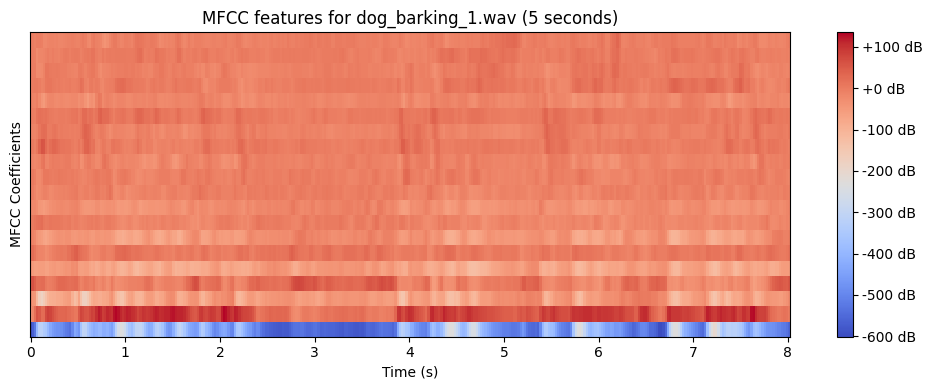

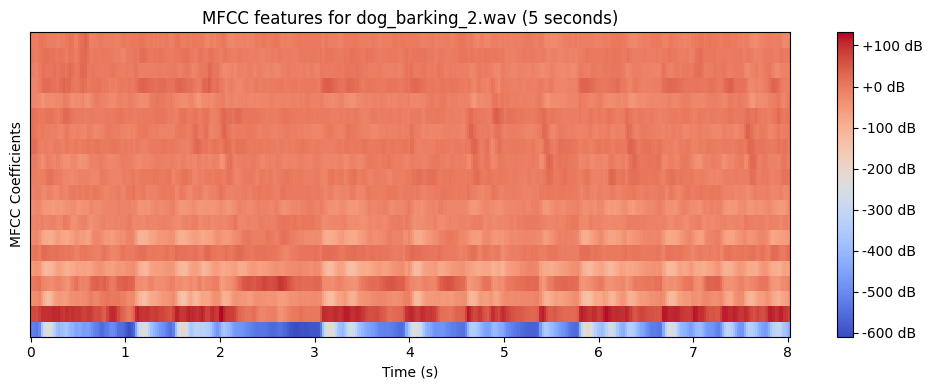

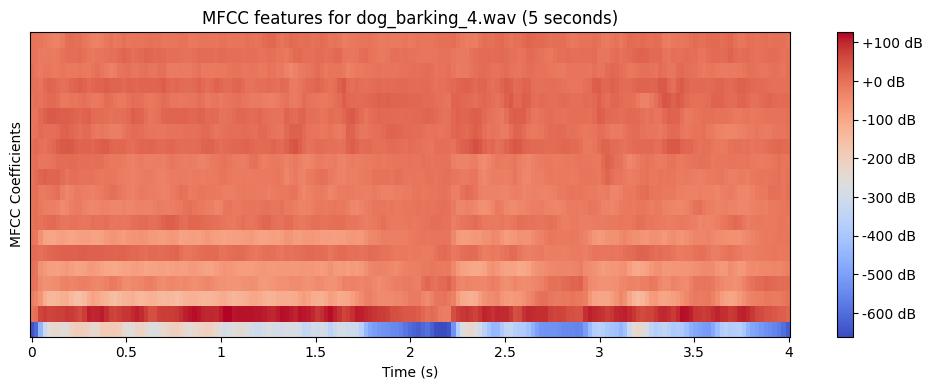

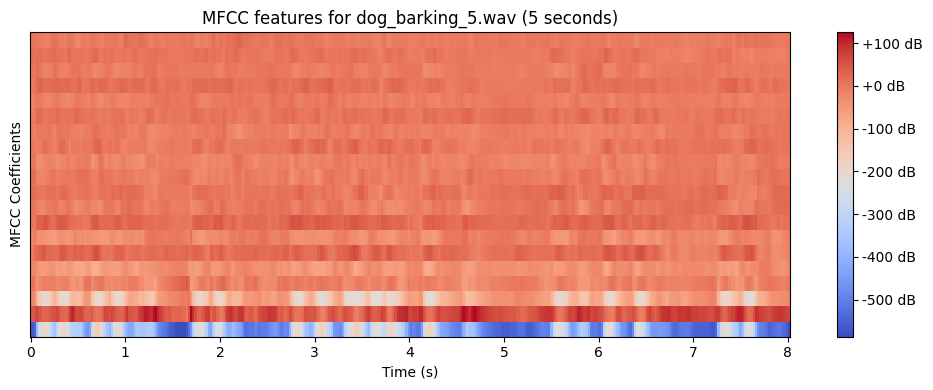

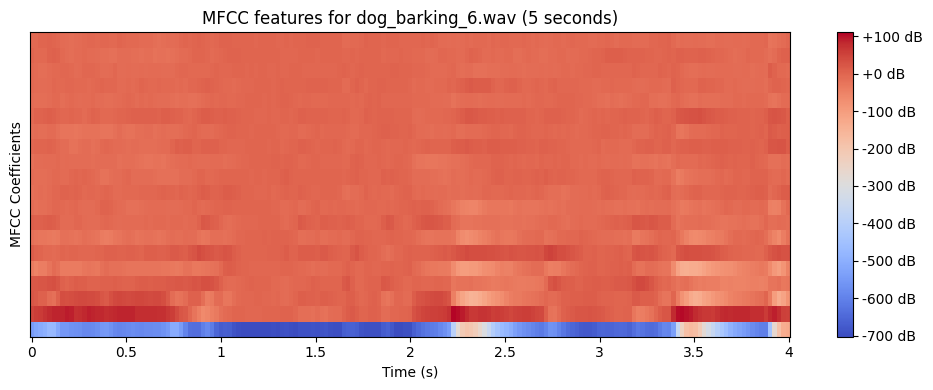

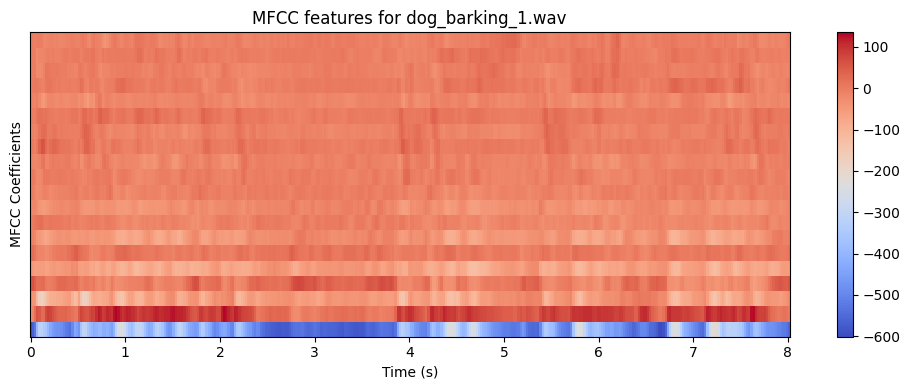

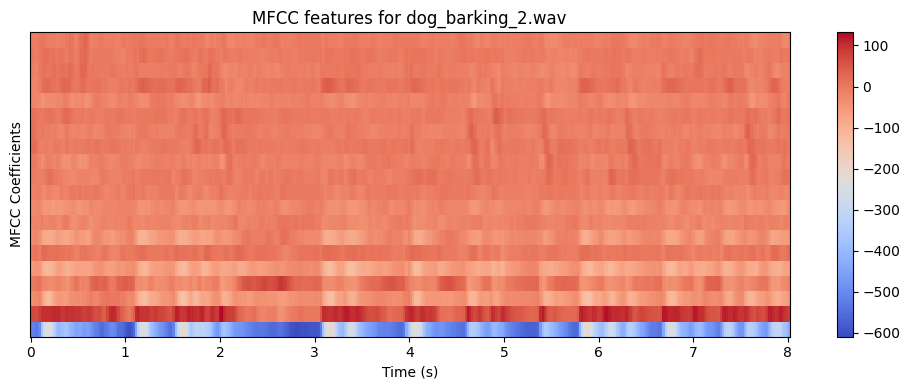

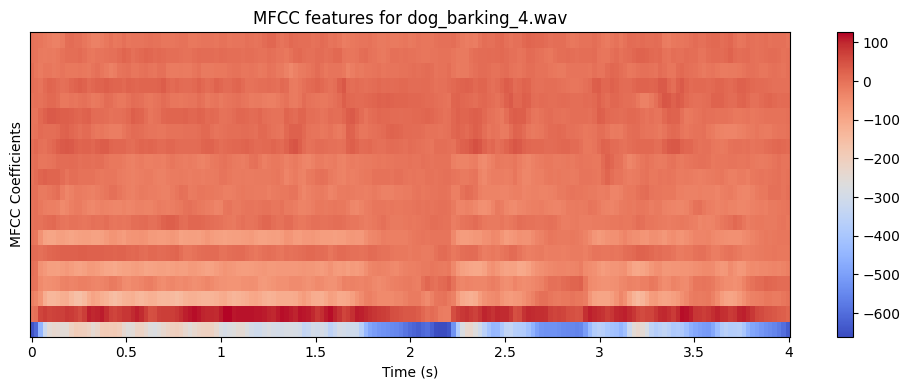

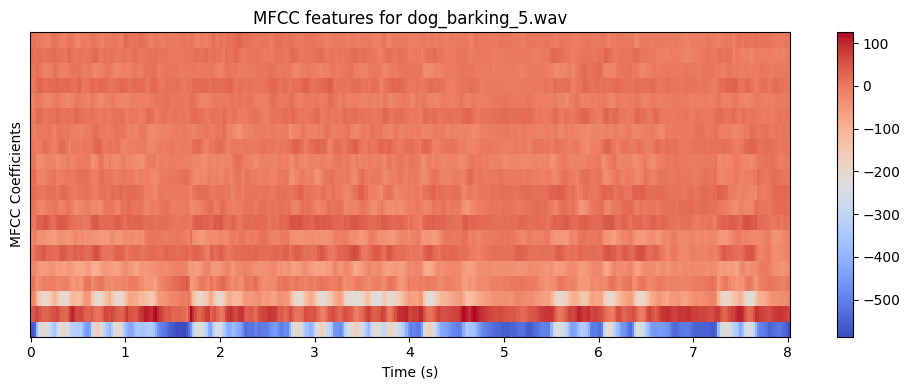

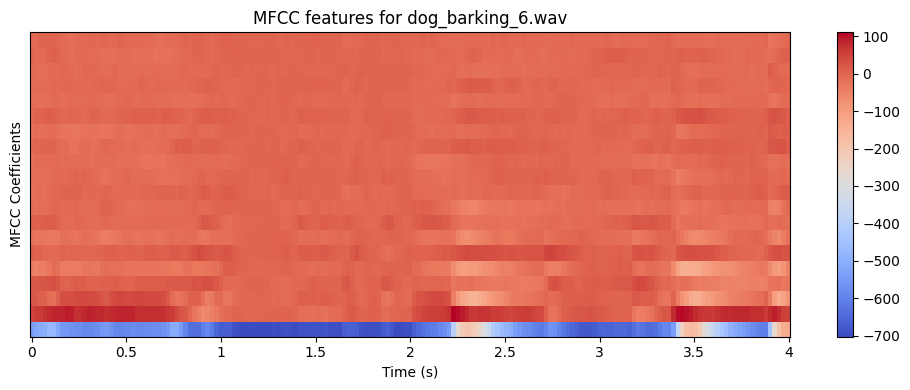

Data values of MFCC features for dog_barking_1.wav:
[[-590.1868    -565.66      -527.01605   ... -523.554     -533.2877
  -554.0556   ]
 [ -34.677895   -16.86138     19.152477  ...   16.574316    12.598053
     1.1935159]
 [ -20.965693   -40.154335   -44.401215  ...  -43.952477   -36.707325
   -24.583775 ]
 ...
 [  -2.1577537   -2.312488    -2.330265  ...  -12.591961   -15.424178
   -12.518317 ]
 [  -1.557823    -2.3405933   -3.704992  ...   -8.535429    -4.194005
    -6.2753105]
 [  -2.324634    -2.5378833   -6.550009  ...  -13.216425    -4.8922505
    -2.1987343]]

Data values of MFCC features for dog_barking_2.wav:
[[-5.2982196e+02 -5.1493805e+02 -5.2364655e+02 ... -3.7314880e+02
  -3.9376050e+02 -4.2931644e+02]
 [ 7.2228592e+01  7.0882698e+01  6.8402740e+01 ...  9.6797188e+01
   8.8875610e+01  8.0785843e+01]
 [-3.3833717e+01 -3.4004887e+01 -2.8950985e+01 ... -7.3054771e+01
  -6.2589256e+01 -4.8624516e+01]
 ...
 [-2.6863914e+00 -9.7721672e+00 -1.5470149e+01 ... -1.3814342e+01
  -1.2

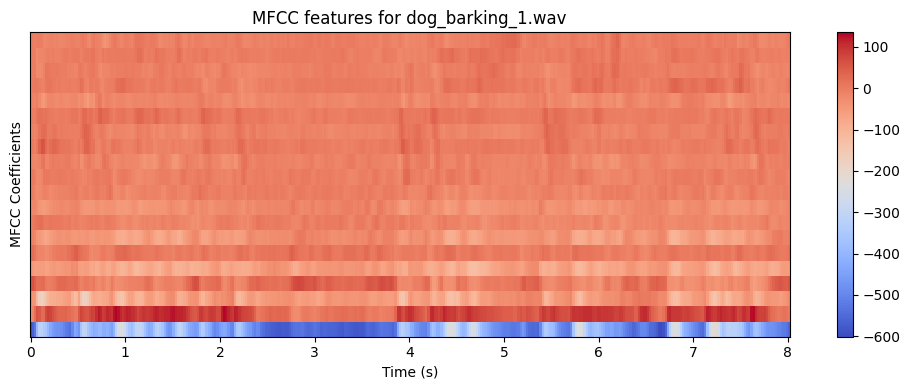

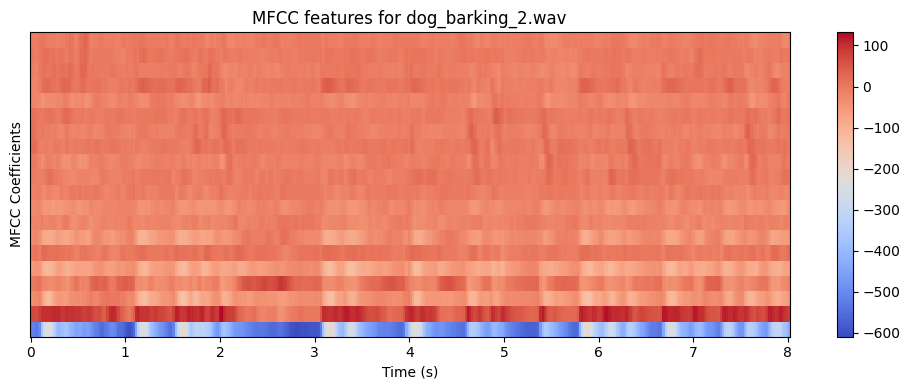

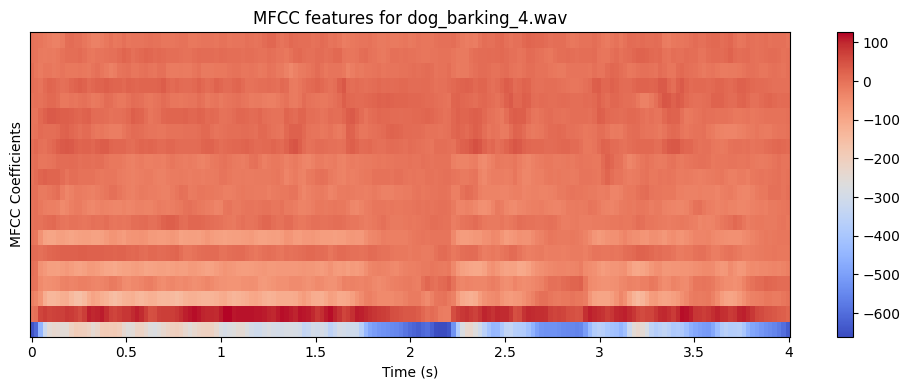

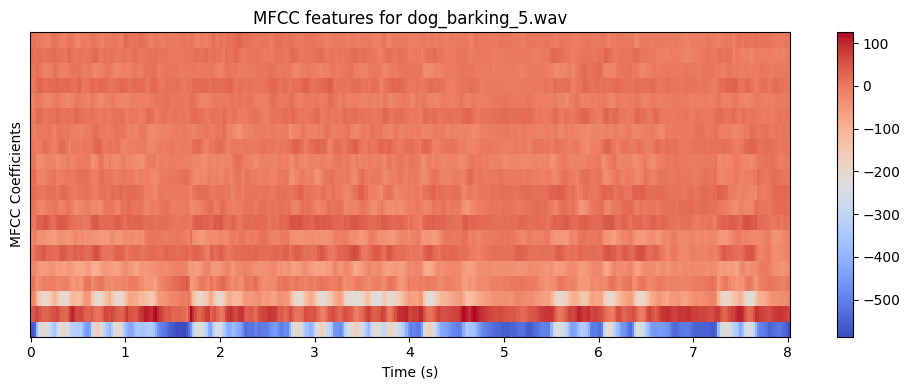

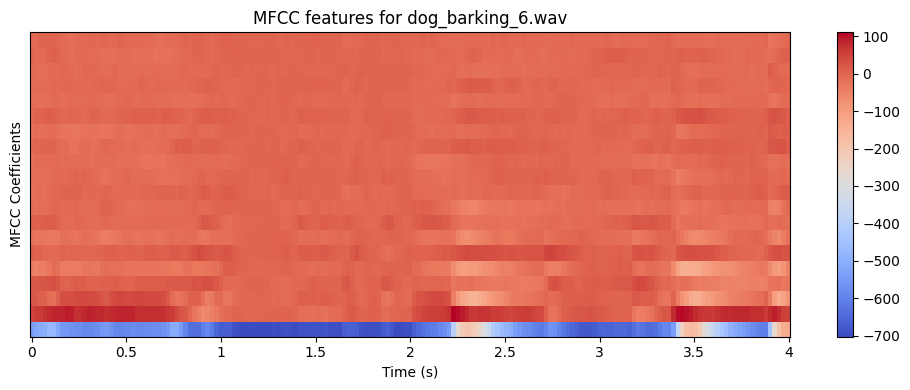

In [90]:

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# Function to extract MFCC features for a given audio file
def extract_mfcc(audio_file, segment_duration=4):
    audio, sr = librosa.load(audio_file)

    # Check if the audio is shorter than the segment duration
    if len(audio) < segment_duration * sr:
        print(f"Warning: Audio file '{audio_file}' is too short for the specified segment duration. Skipping...")
        return None

    # Apply Pre-Emphasis to the audio signal
    audio_pre_emphasized = pre_emphasis(audio)

    # Segment the pre-emphasized audio using librosa.util.frame
    segment_length = segment_duration * sr
    audio_segments = librosa.util.frame(audio_pre_emphasized, frame_length=segment_length, hop_length=segment_length)

    mfcc_segments = []
    for segment in audio_segments.T:
        mfcc = librosa.feature.mfcc(y=segment, sr=sr)
        mfcc_segments.append(mfcc)

    mfcc_combined = np.concatenate(mfcc_segments, axis=1)
    return mfcc_combined

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']


# Function to perform frame blocking on an audio signal
def frame_blocking(signal, frame_duration=0.1, hop_duration=0.05, sample_rate=22050):
    frame_length = int(frame_duration * sample_rate)
    hop_length = int(hop_duration * sample_rate)
    frames = []
    for i in range(0, len(signal) - frame_length + 1, hop_length):
        frames.append(signal[i:i + frame_length])
    return np.array(frames)

# Cut and play the original audio files (5 seconds each)
for audio_file in audio_files:
    audio, sr = librosa.load(audio_file)
    audio_5s = cut_audio(audio, sr, duration=5)
    print(f"Playing {audio_file} (5 seconds)...")
    display(Audio(audio_5s, rate=sr))

    # Perform frame blocking on the 5-second audio
    frame_duration = 0.1  # 100 ms frames
    hop_duration = 0.05    # 50 ms hop
    frames = frame_blocking(audio_5s, frame_duration, hop_duration, sr)
    print(f"Number of frames: {len(frames)}")
    print()

# Rest of the code remains the same...

# Cut and play the original audio files (5 seconds each)
for audio_file in audio_files:
    audio, sr = librosa.load(audio_file)
    audio_5s = cut_audio(audio, sr, duration=5)
    print(f"Playing {audio_file} (5 seconds)...")
    display(Audio(audio_5s, rate=sr))

    # Perform frame blocking on the 5-second audio
    frame_duration = 0.1  # 100 ms frames
    hop_duration = 0.05    # 50 ms hop
    frames = frame_blocking(audio_5s, frame_duration, hop_duration, sr)
    print(f"Number of frames: {len(frames)}")

    # Display the numerical values of the frames
    print(f"Data values of frames for {audio_file}:")
    for i, frame in enumerate(frames):
        print(f"Frame {i + 1}:\n{frame}")
        print()

# Visualize MFCC features for each 5-second audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        audio, sr = librosa.load(audio_file)
        audio_5s = cut_audio(audio, sr, duration=5)

        # Perform frame blocking on the 5-second audio
        frame_duration = 0.1  # 100 ms frames
        hop_duration = 0.05    # 50 ms hop
        frames = frame_blocking(audio_5s, frame_duration, hop_duration, sr)

        plt.figure(figsize=(10, 4))
        plt.title(f"MFCC features for {audio_file} (5 seconds)")
        librosa.display.specshow(all_mfcc_features[i], x_axis='time', sr=sr)
        plt.colorbar(format='%+2.0f dB')
        plt.xlabel("Time (s)")
        plt.ylabel("MFCC Coefficients")
        plt.tight_layout()
        plt.show()

# Extract MFCC features with Pre-Emphasis for each audio file/SETELAH DI PRE EMPHASIS
all_mfcc_features = []
for audio_file in audio_files:
    mfcc_features = extract_mfcc(audio_file)
    if mfcc_features is not None:
        all_mfcc_features.append(mfcc_features)

# Visualize the MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(all_mfcc_features[i], x_axis='time')
        plt.colorbar()
        plt.title(f'MFCC features for {audio_file}')
        plt.xlabel('Time (s)')
        plt.ylabel('MFCC Coefficients')
        plt.tight_layout()
        plt.show()
# Print the data values of MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        print(f"Data values of MFCC features for {audio_file}:")
        print(all_mfcc_features[i])
        print()

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Extract MFCC features with Pre-Emphasis for each audio file
all_mfcc_features = []
for audio_file in audio_files:
    mfcc_features = extract_mfcc(audio_file)
    if mfcc_features is not None:
        all_mfcc_features.append(mfcc_features)

# Visualize the MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(all_mfcc_features[i], x_axis='time')
        plt.colorbar()
        plt.title(f'MFCC features for {audio_file}')
        plt.xlabel('Time (s)')
        plt.ylabel('MFCC Coefficients')
        plt.tight_layout()
        plt.show()


#cara mengambil datanya?


In [ ]:
pip install librosa matplotlib


MFCC features for dog_barking_1.wav:
[[-590.1868    -565.66      -527.01605   ... -523.554     -533.2877
  -554.0556   ]
 [ -34.677895   -16.86138     19.152477  ...   16.574316    12.598053
     1.1935159]
 [ -20.965693   -40.154335   -44.401215  ...  -43.952477   -36.707325
   -24.583775 ]
 ...
 [  -2.1577537   -2.312488    -2.330265  ...  -12.591961   -15.424178
   -12.518317 ]
 [  -1.557823    -2.3405933   -3.704992  ...   -8.535429    -4.194005
    -6.2753105]
 [  -2.324634    -2.5378833   -6.550009  ...  -13.216425    -4.8922505
    -2.1987343]]
Dimension of MFCC features: (20, 346)

MFCC features for dog_barking_2.wav:
[[-5.2982196e+02 -5.1493805e+02 -5.2364655e+02 ... -3.7314880e+02
  -3.9376050e+02 -4.2931644e+02]
 [ 7.2228592e+01  7.0882698e+01  6.8402740e+01 ...  9.6797188e+01
   8.8875610e+01  8.0785843e+01]
 [-3.3833717e+01 -3.4004887e+01 -2.8950985e+01 ... -7.3054771e+01
  -6.2589256e+01 -4.8624516e+01]
 ...
 [-2.6863914e+00 -9.7721672e+00 -1.5470149e+01 ... -1.3814342e+0

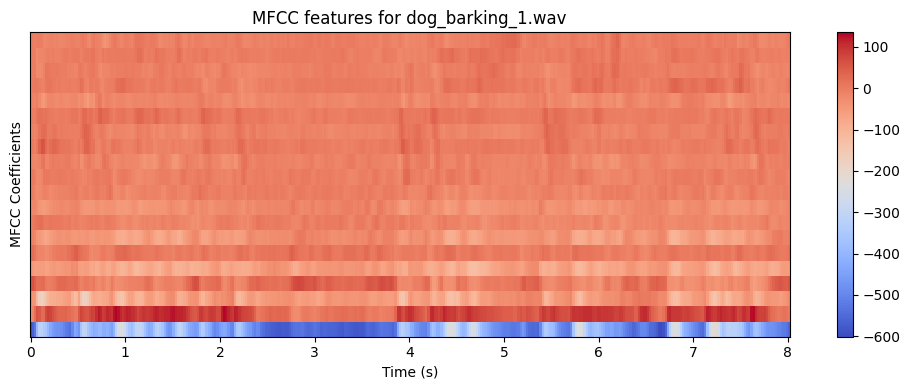

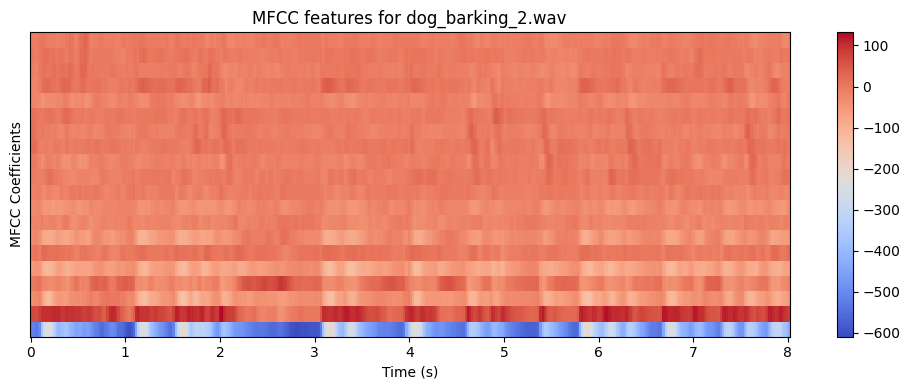

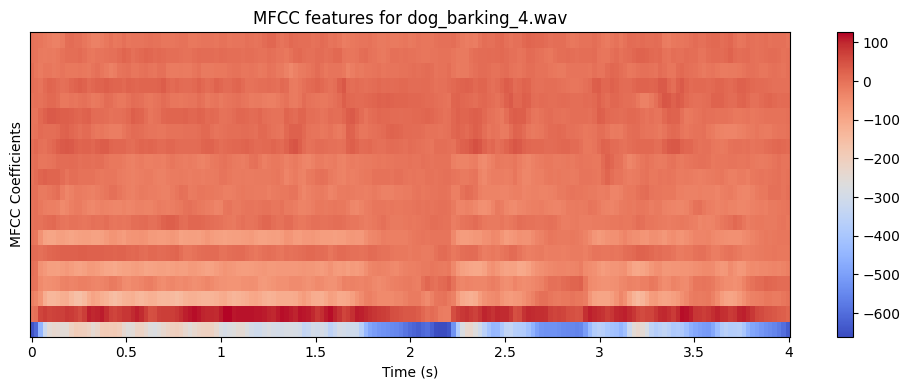

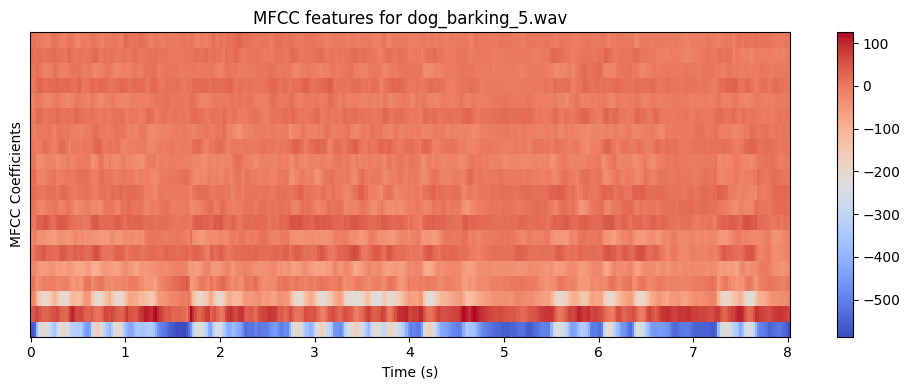

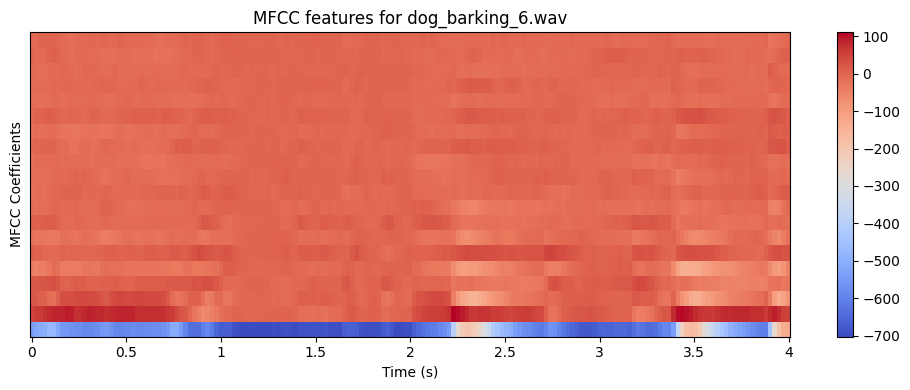

In [88]:
import librosa
import numpy as np

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# Function to extract MFCC features for a given audio file
def extract_mfcc(audio_file, segment_duration=4):
    audio, sr = librosa.load(audio_file)

    # Check if the audio is shorter than the segment duration
    if len(audio) < segment_duration * sr:
        print(f"Warning: Audio file '{audio_file}' is too short for the specified segment duration. Skipping...")
        return None

    # Apply Pre-Emphasis to the audio signal
    audio_pre_emphasized = pre_emphasis(audio)

    # Segment the pre-emphasized audio using librosa.util.frame
    segment_length = segment_duration * sr
    audio_segments = librosa.util.frame(audio_pre_emphasized, frame_length=segment_length, hop_length=segment_length)

    mfcc_segments = []
    for segment in audio_segments.T:
        mfcc = librosa.feature.mfcc(y=segment, sr=sr)
        mfcc_segments.append(mfcc)

    mfcc_combined = np.concatenate(mfcc_segments, axis=1)
    return mfcc_combined

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Extract MFCC features with Pre-Emphasis for each audio file
all_mfcc_features = []
for audio_file in audio_files:
    mfcc_features = extract_mfcc(audio_file)
    if mfcc_features is not None:
        all_mfcc_features.append(mfcc_features)

# Print the MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        print(f'MFCC features for {audio_file}:')
        print(all_mfcc_features[i])
        print('Dimension of MFCC features:', all_mfcc_features[i].shape)
        print()
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# Function to extract MFCC features for a given audio file
def extract_mfcc(audio_file, segment_duration=4):
    audio, sr = librosa.load(audio_file)

    # Check if the audio is shorter than the segment duration
    if len(audio) < segment_duration * sr:
        print(f"Warning: Audio file '{audio_file}' is too short for the specified segment duration. Skipping...")
        return None

    # Apply Pre-Emphasis to the audio signal
    audio_pre_emphasized = pre_emphasis(audio)

    # Segment the pre-emphasized audio using librosa.util.frame
    segment_length = segment_duration * sr
    audio_segments = librosa.util.frame(audio_pre_emphasized, frame_length=segment_length, hop_length=segment_length)

    mfcc_segments = []
    for segment in audio_segments.T:
        mfcc = librosa.feature.mfcc(y=segment, sr=sr)
        mfcc_segments.append(mfcc)

    mfcc_combined = np.concatenate(mfcc_segments, axis=1)
    return mfcc_combined

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Extract MFCC features with Pre-Emphasis for each audio file
all_mfcc_features = []
for audio_file in audio_files:
    mfcc_features = extract_mfcc(audio_file)
    if mfcc_features is not None:
        all_mfcc_features.append(mfcc_features)

# Visualize the MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(all_mfcc_features[i], x_axis='time')
        plt.colorbar()
        plt.title(f'MFCC features for {audio_file}')
        plt.xlabel('Time (s)')
        plt.ylabel('MFCC Coefficients')
        plt.tight_layout()
        plt.show()




Playing dog_barking_1.wav (5 seconds)...


Playing dog_barking_2.wav (5 seconds)...


Playing dog_barking_4.wav (5 seconds)...


Playing dog_barking_5.wav (5 seconds)...


Playing dog_barking_6.wav (5 seconds)...


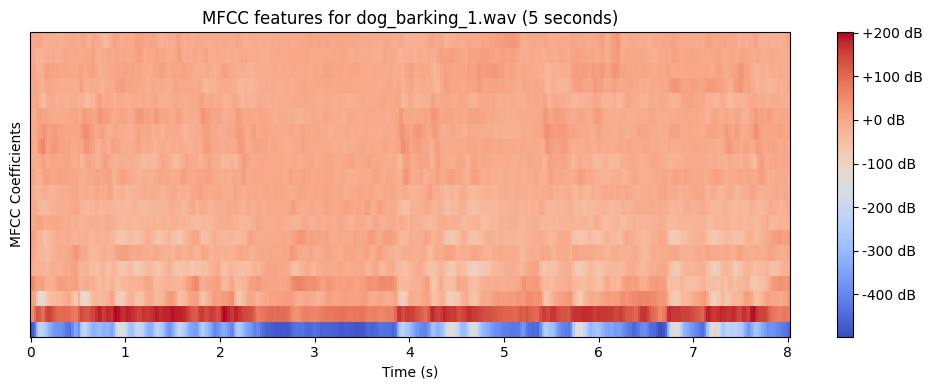

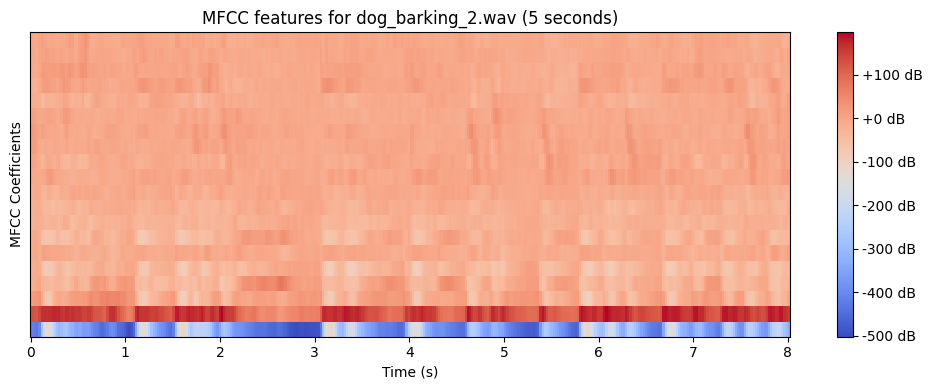

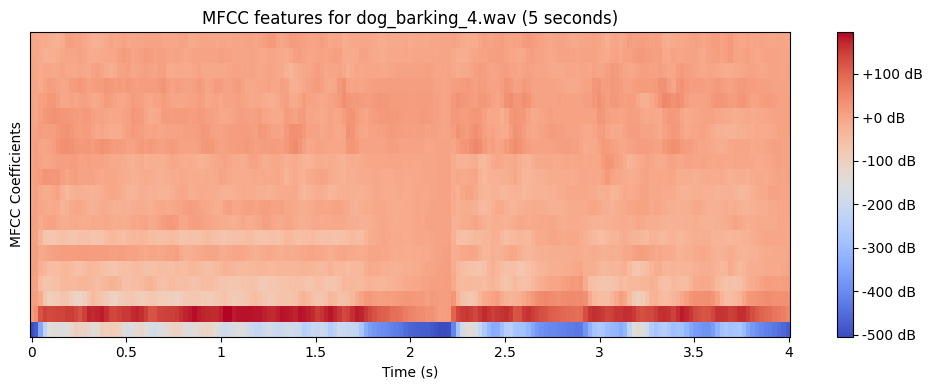

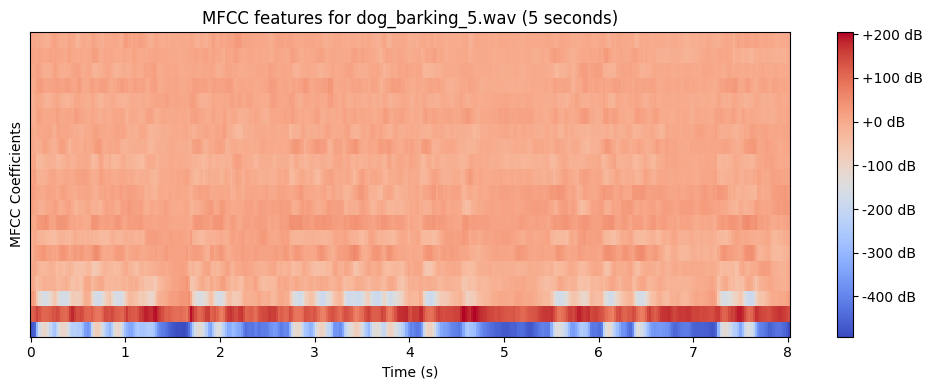

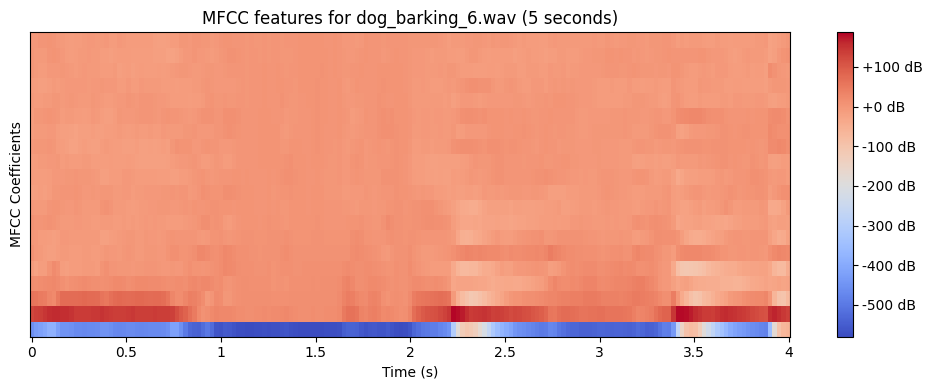

# ***proses dari tahapan mfcc***

In [ ]:
import librosa
import numpy as np

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# Function to extract MFCC features for a given audio file
def extract_mfcc(audio_file, segment_duration=4):
    audio, sr = librosa.load(audio_file)

    # Check if the audio is shorter than the segment duration
    if len(audio) < segment_duration * sr:
        print(f"Warning: Audio file '{audio_file}' is too short for the specified segment duration. Skipping...")
        return None

    # Apply Pre-Emphasis to the audio signal
    audio_pre_emphasized = pre_emphasis(audio)

    # Segment the pre-emphasized audio using librosa.util.frame
    segment_length = segment_duration * sr
    audio_segments = librosa.util.frame(audio_pre_emphasized, frame_length=segment_length, hop_length=segment_length)

    mfcc_segments = []
    for segment in audio_segments.T:
        mfcc = librosa.feature.mfcc(y=segment, sr=sr)
        mfcc_segments.append(mfcc)

    mfcc_combined = np.concatenate(mfcc_segments, axis=1)
    return mfcc_combined

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Extract MFCC features with Pre-Emphasis for each audio file
all_mfcc_features = []
for audio_file in audio_files:
    mfcc_features = extract_mfcc(audio_file)
    if mfcc_features is not None:
        all_mfcc_features.append(mfcc_features)

# Print the MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        print(f'MFCC features for {audio_file}:')
        print(all_mfcc_features[i])
        print('Dimension of MFCC features:', all_mfcc_features[i].shape)
        print()
#menampilkan visualisasinya dibawa


MFCC features for dog_barking_1.wav:
[[-590.1868    -565.66      -527.01605   ... -523.554     -533.2877
  -554.0556   ]
 [ -34.677895   -16.86138     19.152477  ...   16.574316    12.598053
     1.1935159]
 [ -20.965693   -40.154335   -44.401215  ...  -43.952477   -36.707325
   -24.583775 ]
 ...
 [  -2.1577537   -2.312488    -2.330265  ...  -12.591961   -15.424178
   -12.518317 ]
 [  -1.557823    -2.3405933   -3.704992  ...   -8.535429    -4.194005
    -6.2753105]
 [  -2.324634    -2.5378833   -6.550009  ...  -13.216425    -4.8922505
    -2.1987343]]
Dimension of MFCC features: (20, 346)

MFCC features for dog_barking_2.wav:
[[-5.2982196e+02 -5.1493805e+02 -5.2364655e+02 ... -3.7314880e+02
  -3.9376050e+02 -4.2931644e+02]
 [ 7.2228592e+01  7.0882698e+01  6.8402740e+01 ...  9.6797188e+01
   8.8875610e+01  8.0785843e+01]
 [-3.3833717e+01 -3.4004887e+01 -2.8950985e+01 ... -7.3054771e+01
  -6.2589256e+01 -4.8624516e+01]
 ...
 [-2.6863914e+00 -9.7721672e+00 -1.5470149e+01 ... -1.3814342e+0

# **PROSES PRE EMPHASIS DAN VISUALISASINYA **
*teks yang dimiringkan*

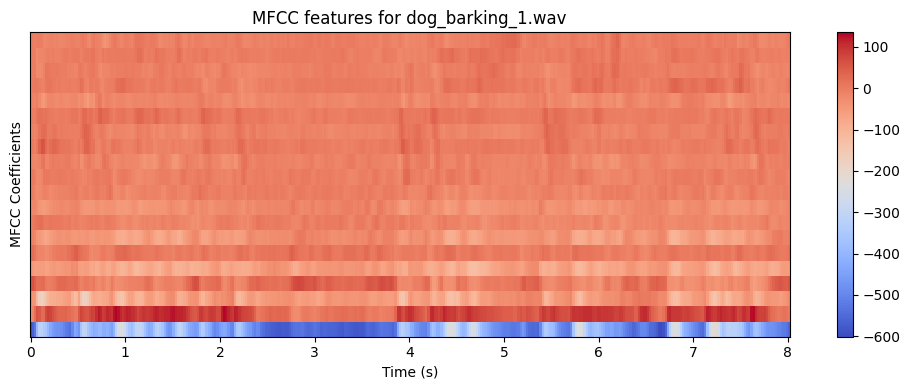

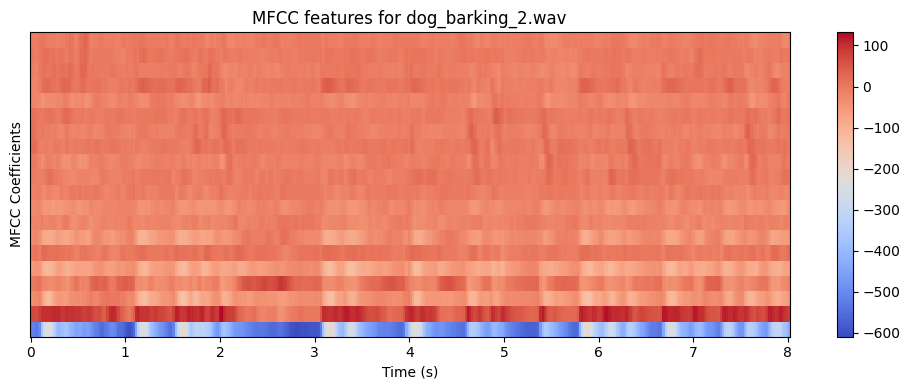

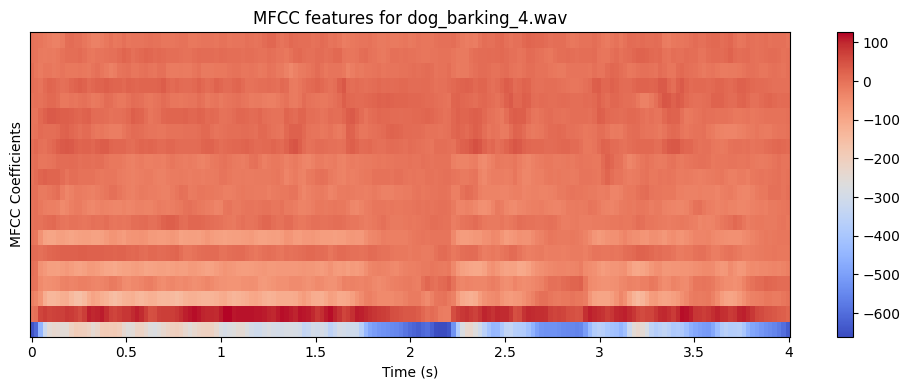

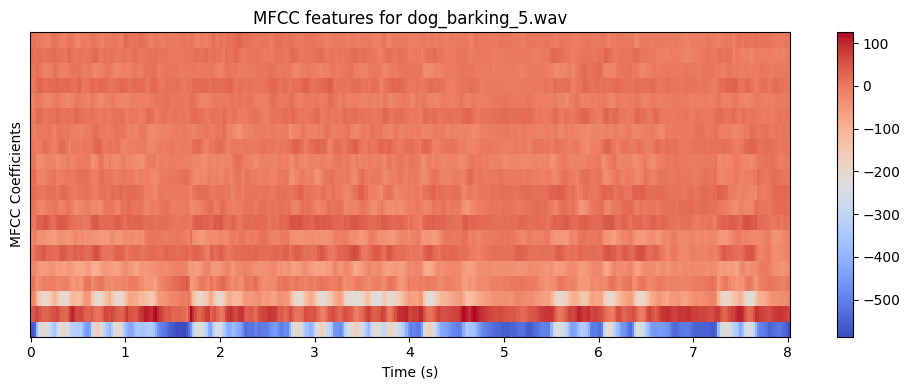

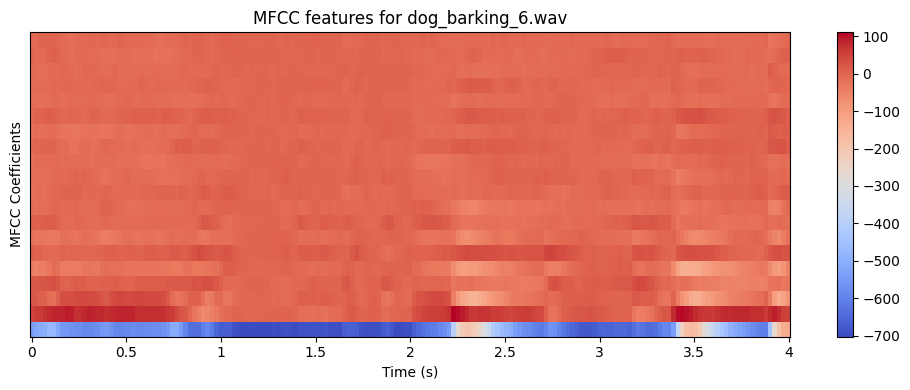

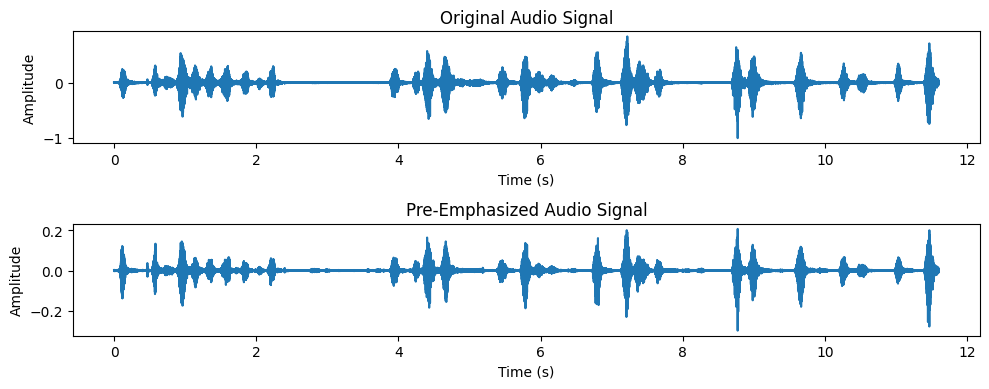

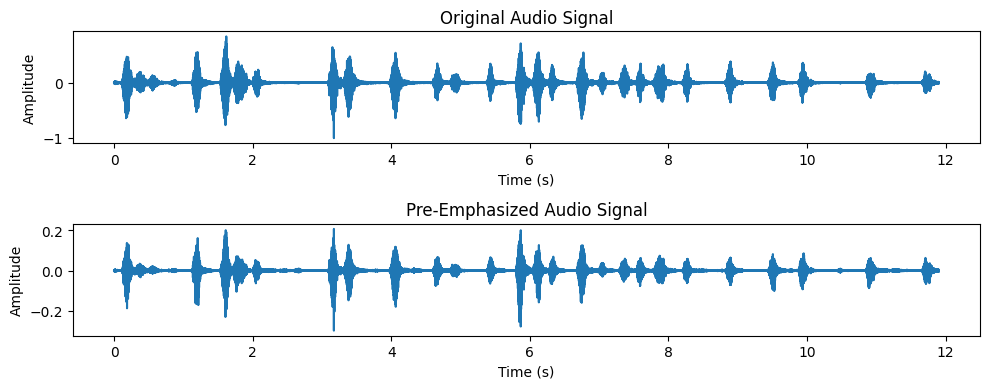

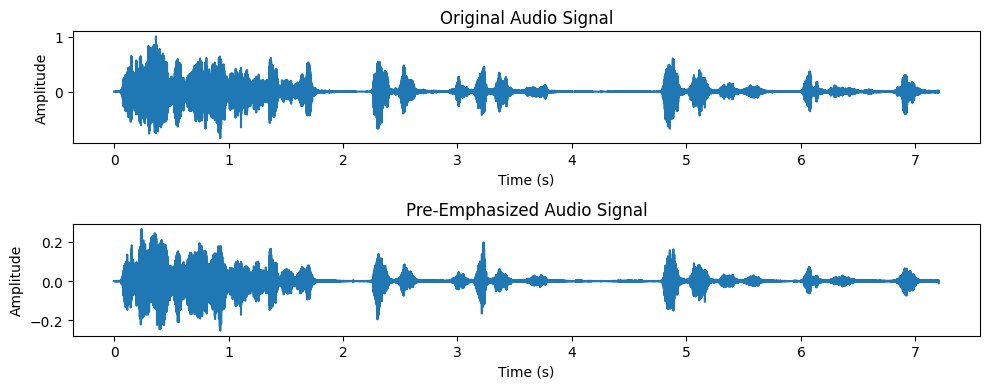

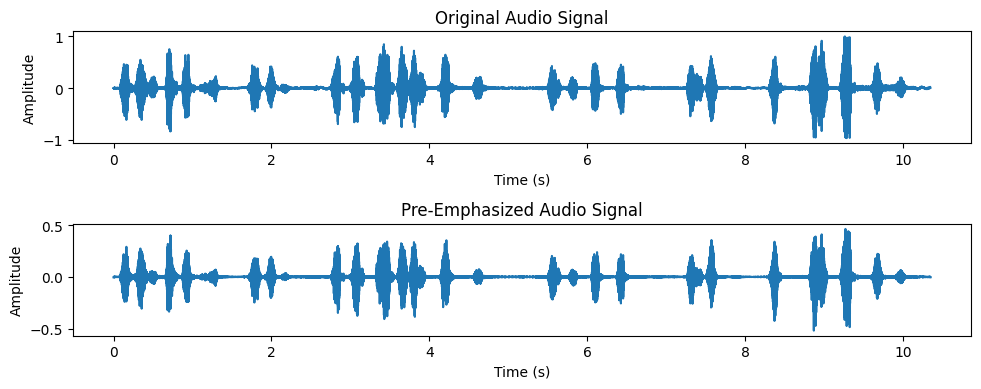

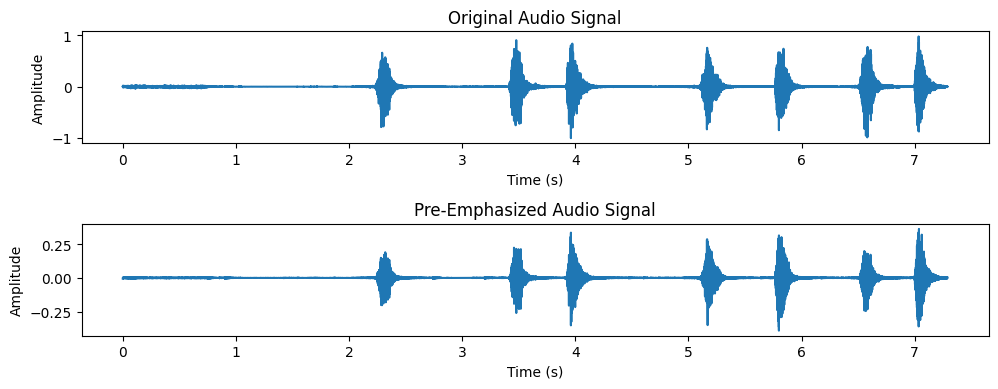

Pre-Emphasized Audio Signal for dog_barking_1.wav: 
[ 0.0025185  -0.00083422 -0.00211101 ... -0.00340219 -0.00286198
  0.00549549]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]


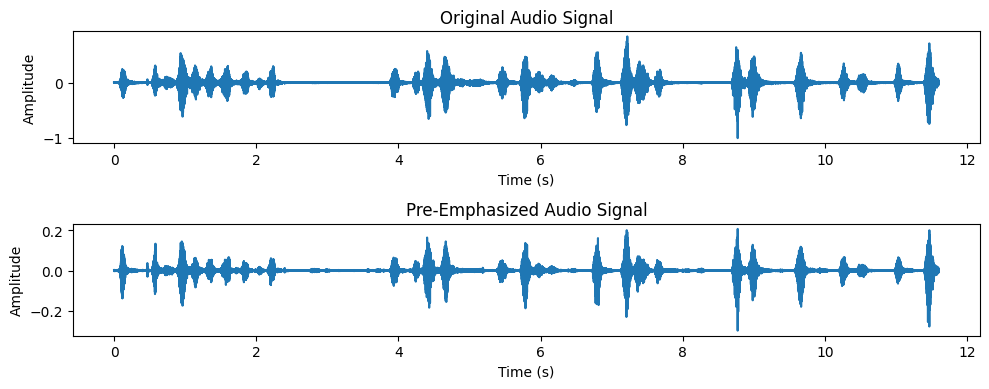

Pre-Emphasized Audio Signal for dog_barking_2.wav: 
[-0.00324605 -0.00386652 -0.00279708 ...  0.00126285  0.00237306
 -0.00516116]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]


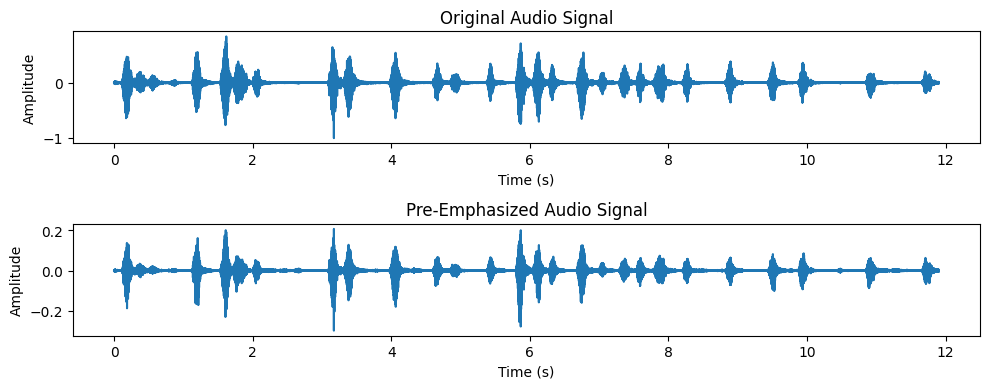

Pre-Emphasized Audio Signal for dog_barking_4.wav: 
[-5.1276048e-04 -4.3216860e-06  2.8064279e-04 ...  4.4882325e-03
 -3.6557112e-04 -1.1102610e-02]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]


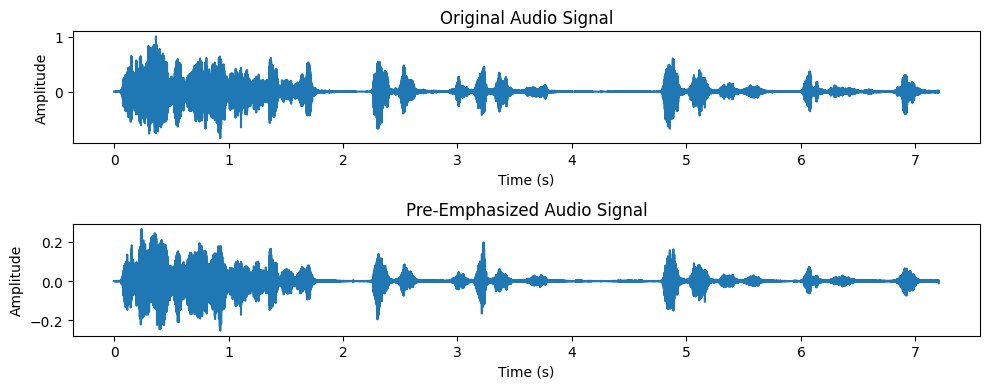

Pre-Emphasized Audio Signal for dog_barking_5.wav: 
[-4.3859566e-03 -1.8195286e-03 -6.3067069e-04 ...  7.3665287e-04
 -1.3001263e-06 -3.8570066e-03]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]


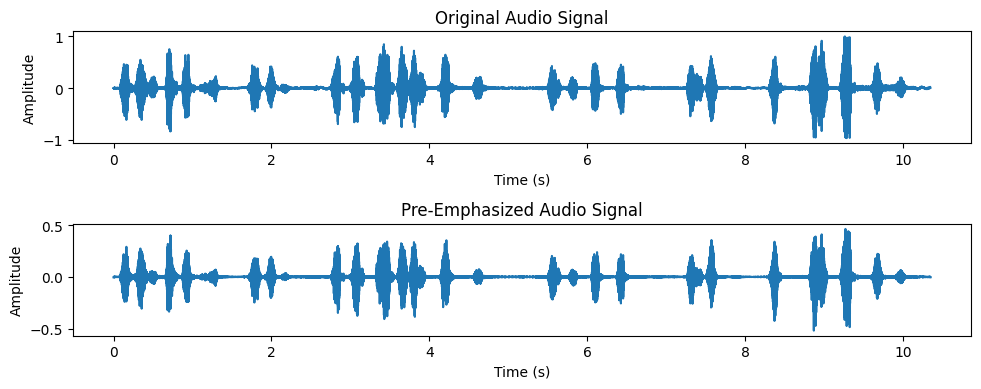

Pre-Emphasized Audio Signal for dog_barking_6.wav: 
[-0.00470071 -0.0012234   0.00237541 ... -0.00058128  0.00027324
  0.00317216]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]


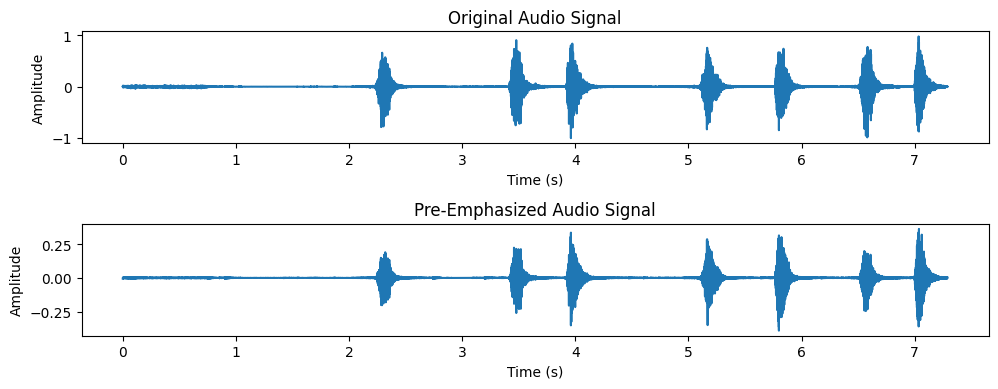

In [93]:

import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# Function to extract MFCC features for a given audio file
def extract_mfcc(audio_file, segment_duration=4):
    audio, sr = librosa.load(audio_file)

    # Check if the audio is shorter than the segment duration
    if len(audio) < segment_duration * sr:
        print(f"Warning: Audio file '{audio_file}' is too short for the specified segment duration. Skipping...")
        return None

    # Apply Pre-Emphasis to the audio signal
    audio_pre_emphasized = pre_emphasis(audio)

    # Segment the pre-emphasized audio using librosa.util.frame
    segment_length = segment_duration * sr
    audio_segments = librosa.util.frame(audio_pre_emphasized, frame_length=segment_length, hop_length=segment_length)

    mfcc_segments = []
    for segment in audio_segments.T:
        mfcc = librosa.feature.mfcc(y=segment, sr=sr)
        mfcc_segments.append(mfcc)

    mfcc_combined = np.concatenate(mfcc_segments, axis=1)
    return mfcc_combined

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Extract MFCC features with Pre-Emphasis for each audio file
all_mfcc_features = []
for audio_file in audio_files:
    mfcc_features = extract_mfcc(audio_file)
    if mfcc_features is not None:
        all_mfcc_features.append(mfcc_features)

# Visualize the MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(all_mfcc_features[i], x_axis='time')
        plt.colorbar()
        plt.title(f'MFCC features for {audio_file}')
        plt.xlabel('Time (s)')
        plt.ylabel('MFCC Coefficients')
        plt.tight_layout()
        plt.show()

#nilain pre emphasis
import librosa
import numpy as np
import librosa.display
import matplotlib.pyplot as plt

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Pre-emphasize and visualize each audio file
for audio_file in audio_files:
    audio, sr = librosa.load(audio_file)

    # Pre-Emphasis process
    audio_pre_emphasized = pre_emphasis(audio)

    # Plot the pre-emphasized audio signal
    plt.figure(figsize=(10, 4))
    plt.subplot(2, 1, 1)
    plt.plot(np.arange(len(audio)) / sr, audio)
    plt.title('Original Audio Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    plt.subplot(2, 1, 2)
    plt.plot(np.arange(len(audio_pre_emphasized)) / sr, audio_pre_emphasized)
    plt.title('Pre-Emphasized Audio Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()
#data nilai dari gambar

import librosa
import numpy as np
import librosa.display
import matplotlib.pyplot as plt

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Pre-emphasize and visualize each audio file
for audio_file in audio_files:
    audio, sr = librosa.load(audio_file)

    # Pre-Emphasis process
    audio_pre_emphasized = pre_emphasis(audio)

    # Print the pre-emphasized audio signal
    print("Pre-Emphasized Audio Signal for {}: \n{}".format(audio_file, audio_pre_emphasized))
    print("Original Signal:", signal)
    print("Signal with Pre-Emphasis:", preemphasized_signal)

    # Plot the pre-emphasized audio signal
    plt.figure(figsize=(10, 4))
    plt.subplot(2, 1, 1)
    plt.plot(np.arange(len(audio)) / sr, audio)
    plt.title('Original Audio Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    plt.subplot(2, 1, 2)
    plt.plot(np.arange(len(audio_pre_emphasized)) / sr, audio_pre_emphasized)
    plt.title('Pre-Emphasized Audio Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()


In [ ]:
pip install librosa matplotlib numpy pydub IPython


# ***menampilkan audio asli dan nilai asli dan setelah di pre emphasis***

Pre-Emphasized Audio Signal for dog_barking_1.wav: 
[ 0.0025185  -0.00083422 -0.00211101 ... -0.00340219 -0.00286198
  0.00549549]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]
Playing the original audio...


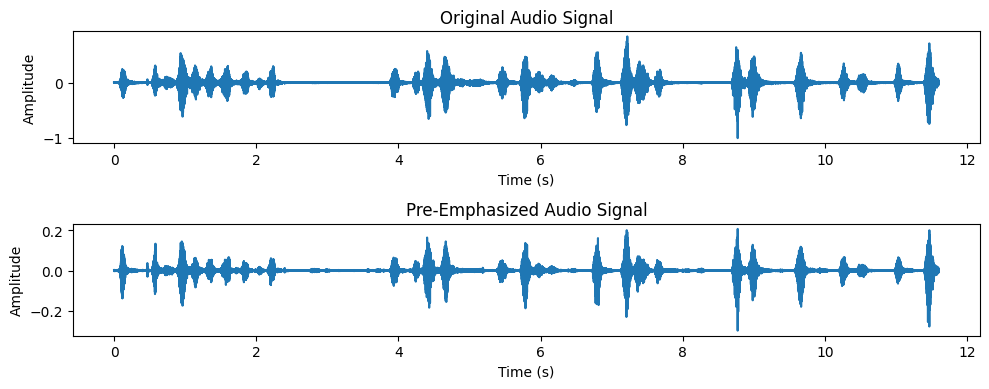

Pre-Emphasized Audio Signal for dog_barking_2.wav: 
[-0.00324605 -0.00386652 -0.00279708 ...  0.00126285  0.00237306
 -0.00516116]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]
Playing the original audio...


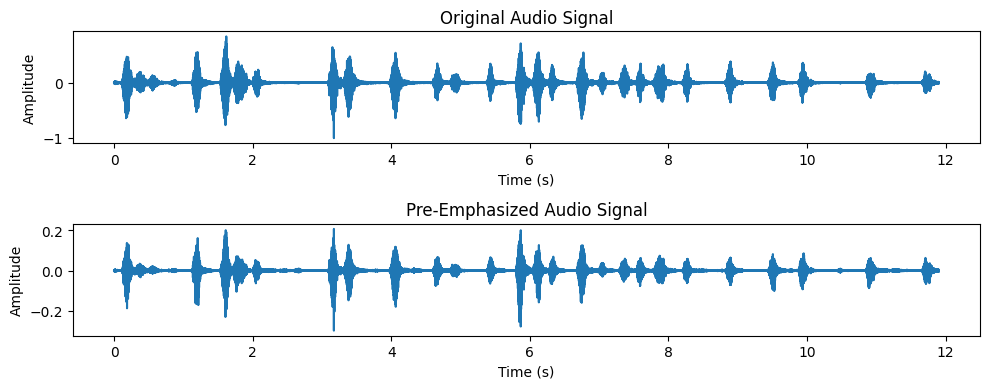

Pre-Emphasized Audio Signal for dog_barking_4.wav: 
[-5.1276048e-04 -4.3216860e-06  2.8064279e-04 ...  4.4882325e-03
 -3.6557112e-04 -1.1102610e-02]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]
Playing the original audio...


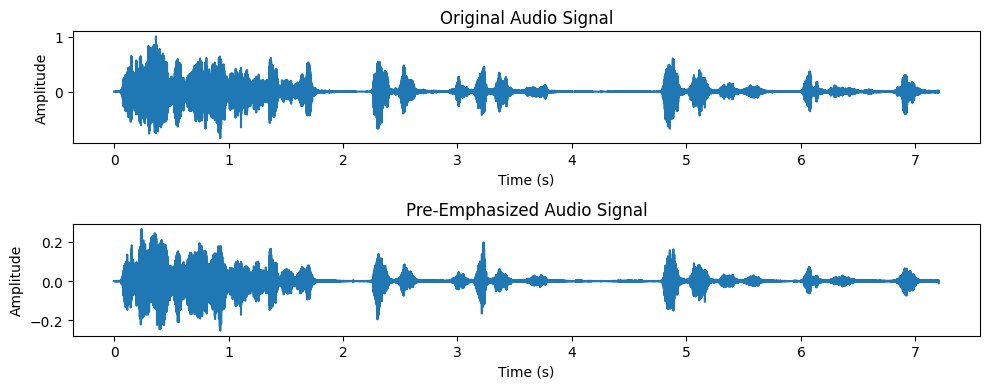

Pre-Emphasized Audio Signal for dog_barking_5.wav: 
[-4.3859566e-03 -1.8195286e-03 -6.3067069e-04 ...  7.3665287e-04
 -1.3001263e-06 -3.8570066e-03]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]
Playing the original audio...


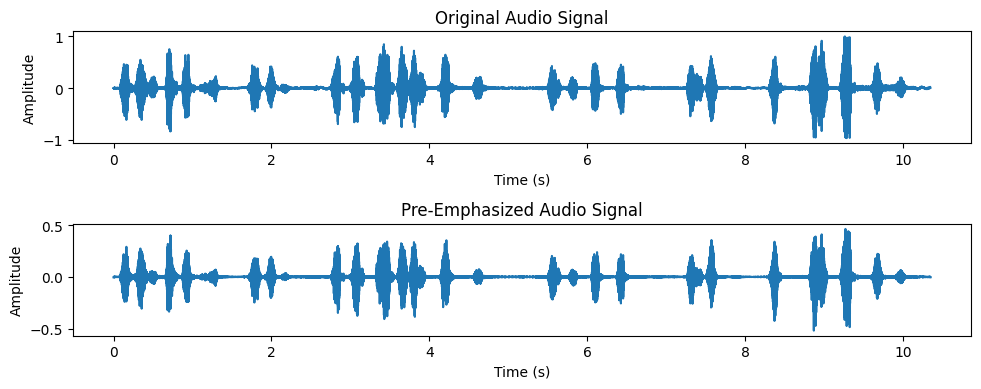

Pre-Emphasized Audio Signal for dog_barking_6.wav: 
[-0.00470071 -0.0012234   0.00237541 ... -0.00058128  0.00027324
  0.00317216]
Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.    -1.61   3.71 ... -59.76 -26.97 -15.22]
Playing the original audio...


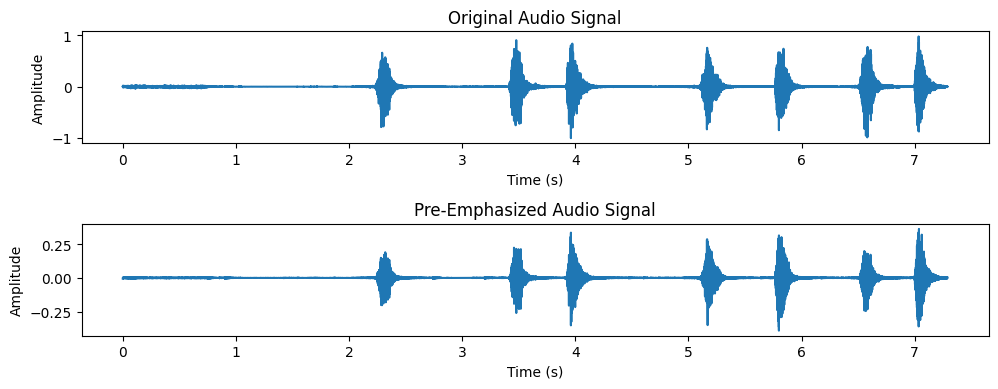

In [ ]:
import librosa
import numpy as np
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Pre-emphasize and visualize each audio file
for audio_file in audio_files:
    audio, sr = librosa.load(audio_file)

    # Pre-Emphasis process
    audio_pre_emphasized = pre_emphasis(audio)

    # Print the pre-emphasized audio signal
    print("Pre-Emphasized Audio Signal for {}: \n{}".format(audio_file, audio_pre_emphasized))
    print("Original Signal:", signal)
    print("Signal with Pre-Emphasis:", preemphasized_signal)

    # Play the original audio
    print("Playing the original audio...")
    display(Audio(audio, rate=sr))

    # Plot the pre-emphasized audio signal
    plt.figure(figsize=(10, 4))
    plt.subplot(2, 1, 1)
    plt.plot(np.arange(len(audio)) / sr, audio)
    plt.title('Original Audio Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    plt.subplot(2, 1, 2)
    plt.plot(np.arange(len(audio_pre_emphasized)) / sr, audio_pre_emphasized)
    plt.title('Pre-Emphasized Audio Signal')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()


coba coba potong audio

# **FRAME BLOCKING**

In [ ]:
import librosa
import numpy as np
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio

# Function to perform Pre-Emphasis on an audio signal
def pre_emphasis(signal, coeff=0.97):
    return np.append(signal[0], signal[1:] - coeff * signal[:-1])

# Function to perform frame blocking on an audio signal
def frame_blocking(signal, frame_duration=0.1):
    frame_length = int(frame_duration * sr)
    return librosa.util.frame(signal, frame_length, hop_length=frame_length)

# Function to extract MFCC features for a given audio file
def extract_mfcc(audio_file, segment_duration=4, frame_duration=0.1):
    audio, sr = librosa.load(audio_file)

    # Check if the audio is shorter than the segment duration
    if len(audio) < segment_duration * sr:
        print(f"Warning: Audio file '{audio_file}' is too short for the specified segment duration. Skipping...")
        return None

    # Apply Pre-Emphasis to the audio signal
    audio_pre_emphasized = pre_emphasis(audio)

    # Segment the pre-emphasized audio using frame blocking
    frames = frame_blocking(audio_pre_emphasized, frame_duration=frame_duration)

    mfcc_segments = []
    for frame in frames.T:
        mfcc = librosa.feature.mfcc(y=frame, sr=sr)
        mfcc_segments.append(mfcc)

    mfcc_combined = np.concatenate(mfcc_segments, axis=1)
    return mfcc_combined

# List of audio files
audio_files = ['dog_barking_1.wav', 'dog_barking_2.wav', 'dog_barking_4.wav', 'dog_barking_5.wav', 'dog_barking_6.wav']

# Extract MFCC features with Pre-Emphasis and Frame Blocking for each audio file
all_mfcc_features = []
for audio_file in audio_files:
    mfcc_features = extract_mfcc(audio_file)
    if mfcc_features is not None:
        all_mfcc_features.append(mfcc_features)

# Visualize the MFCC features for each audio file
for i, audio_file in enumerate(audio_files):
    if i < len(all_mfcc_features):
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(all_mfcc_features[i], x_axis='time')
        plt.colorbar()
        plt.title(f'MFCC features for {audio_file}')
        plt.xlabel('Time (s)')
        plt.ylabel('MFCC Coefficients')
        plt.tight_layout()
        plt.show()


# ***PRE EMPHASIS***

In [ ]:
import numpy as np
import scipy.io.wavfile

sample_rate, signal = scipy.io.wavfile.read('dog_barking_4.wav')  # File assumed to be in the same directory
signal = signal[0:int(3.5 * sample_rate)]  # Keep the first 3.5 seconds

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

# Apply pre-emphasis to the loaded audio signal
preemphasized_signal = apply_preemphasis(signal, pre_emphasis=0.97)

print("Original Signal:", signal)
print("Signal with Pre-Emphasis:", preemphasized_signal)


Original Signal: [ -17  -13   -5 ... -309 -234 -172]
Signal with Pre-Emphasis: [-17.     3.49   7.61 ...  51.84  65.73  54.98]


# ***DATA 1***

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

sample_rate, signal = wav.read('dog_barking_4.wav')  # File dianggap ada dalam direktori yang sama
signal = signal[0:int(3.5 * sample_rate)]  # Pertahankan 3.5 detik pertama

def apply_preemphasis(signal, pre_emphasis=0.67):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

# Melakukan pre-emphasis pada sinyal
preemphasized_signal = apply_preemphasis(signal)

# Plot sinyal asli
plt.subplot(2, 1, 1)
plt.plot(signal)
plt.title('Sinyal Asli')
plt.xlabel('Waktu')
plt.ylabel('Amplitudo')

# Plot sinyal dengan pre-emphasis
plt.subplot(2, 1, 2)
plt.plot(preemphasized_signal)
plt.title('Sinyal dengan Pre-Emphasis')
plt.xlabel('Waktu')
plt.ylabel('Amplitudo')

# Menampilkan plot
plt.tight_layout()
plt.show()

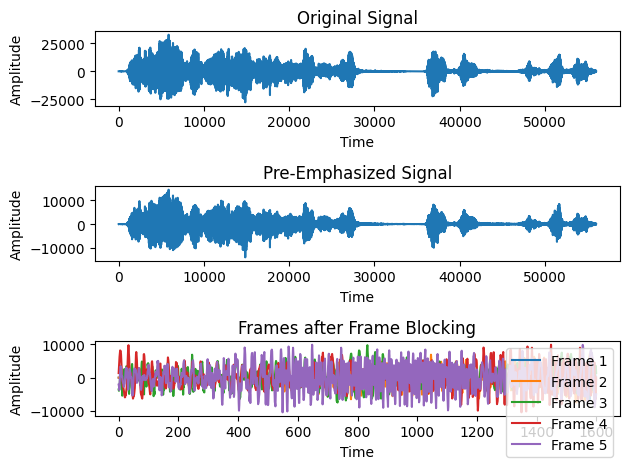

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

# Function to perform Pre-Emphasis on an audio signal
def apply_preemphasis(signal, pre_emphasis=0.67):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

# Function to perform frame blocking on an audio signal
def frame_blocking(signal, frame_duration=0.1, hop_duration=0.05, sample_rate=22050):
    frame_length = int(frame_duration * sample_rate)
    hop_length = int(hop_duration * sample_rate)
    frames = []
    for i in range(0, len(signal) - frame_length + 1, hop_length):
        frames.append(signal[i:i + frame_length])
    return np.array(frames)

# Read the audio file and consider the first 3.5 seconds
sample_rate, signal = wav.read('dog_barking_4.wav')
signal = signal[0:int(3.5 * sample_rate)]

# Apply Pre-Emphasis to the signal
preemphasized_signal = apply_preemphasis(signal)

# Perform Frame Blocking with frame duration of 0.1 seconds and hop duration of 0.05 seconds
frames = frame_blocking(preemphasized_signal, frame_duration=0.1, hop_duration=0.05, sample_rate=sample_rate)

# Plot original signal
plt.subplot(3, 1, 1)
plt.plot(signal)
plt.title('Original Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

# Plot pre-emphasized signal
plt.subplot(3, 1, 2)
plt.plot(preemphasized_signal)
plt.title('Pre-Emphasized Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

# Plot the first 5 frames after frame blocking
plt.subplot(3, 1, 3)
for i in range(5):
    plt.plot(frames[i], label=f'Frame {i + 1}')
plt.title('Frames after Frame Blocking')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

# Display the plots
plt.tight_layout()
plt.show()






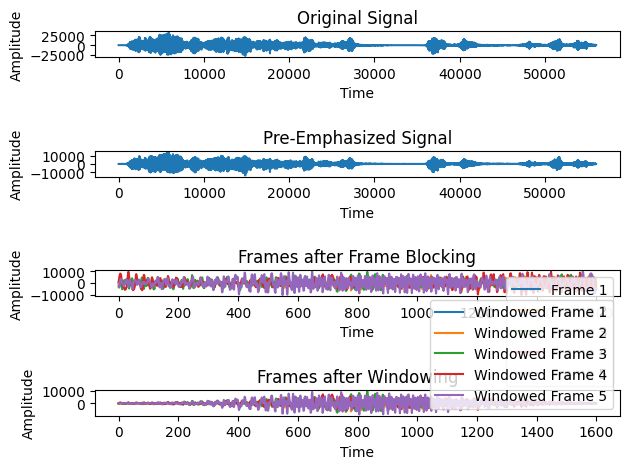

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

# Function to perform Pre-Emphasis on an audio signal
def apply_preemphasis(signal, pre_emphasis=0.67):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

# Function to perform frame blocking on an audio signal
def frame_blocking(signal, frame_duration=0.1, hop_duration=0.05, sample_rate=22050):
    frame_length = int(frame_duration * sample_rate)
    hop_length = int(hop_duration * sample_rate)
    frames = []
    for i in range(0, len(signal) - frame_length + 1, hop_length):
        frames.append(signal[i:i + frame_length])
    return np.array(frames)

# Function to apply windowing (Hamming window) to each frame
def apply_windowing(frames):
    windowed_frames = frames * np.hamming(frames.shape[1])
    return windowed_frames

# Read the audio file and consider the first 3.5 seconds
sample_rate, signal = wav.read('dog_barking_4.wav')
signal = signal[0:int(3.5 * sample_rate)]

# Apply Pre-Emphasis to the signal
preemphasized_signal = apply_preemphasis(signal)

# Perform Frame Blocking with frame duration of 0.1 seconds and hop duration of 0.05 seconds
frames = frame_blocking(preemphasized_signal, frame_duration=0.1, hop_duration=0.05, sample_rate=sample_rate)

# Apply Windowing to the frames (using Hamming window)
windowed_frames = apply_windowing(frames)

# Plot original signal
plt.subplot(4, 1, 1)
plt.plot(signal)
plt.title('Original Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

# Plot pre-emphasized signal
plt.subplot(4, 1, 2)
plt.plot(preemphasized_signal)
plt.title('Pre-Emphasized Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

# Plot the first 5 frames after frame blocking
plt.subplot(4, 1, 3)
for i in range(5):
    plt.plot(frames[i], label=f'Frame {i + 1}')
plt.title('Frames after Frame Blocking')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

# Plot the first 5 frames after windowing
plt.subplot(4, 1, 4)
for i in range(5):
    plt.plot(windowed_frames[i], label=f'Windowed Frame {i + 1}')
plt.title('Frames after Windowing')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()

# Display the plots
plt.tight_layout()
plt.show()


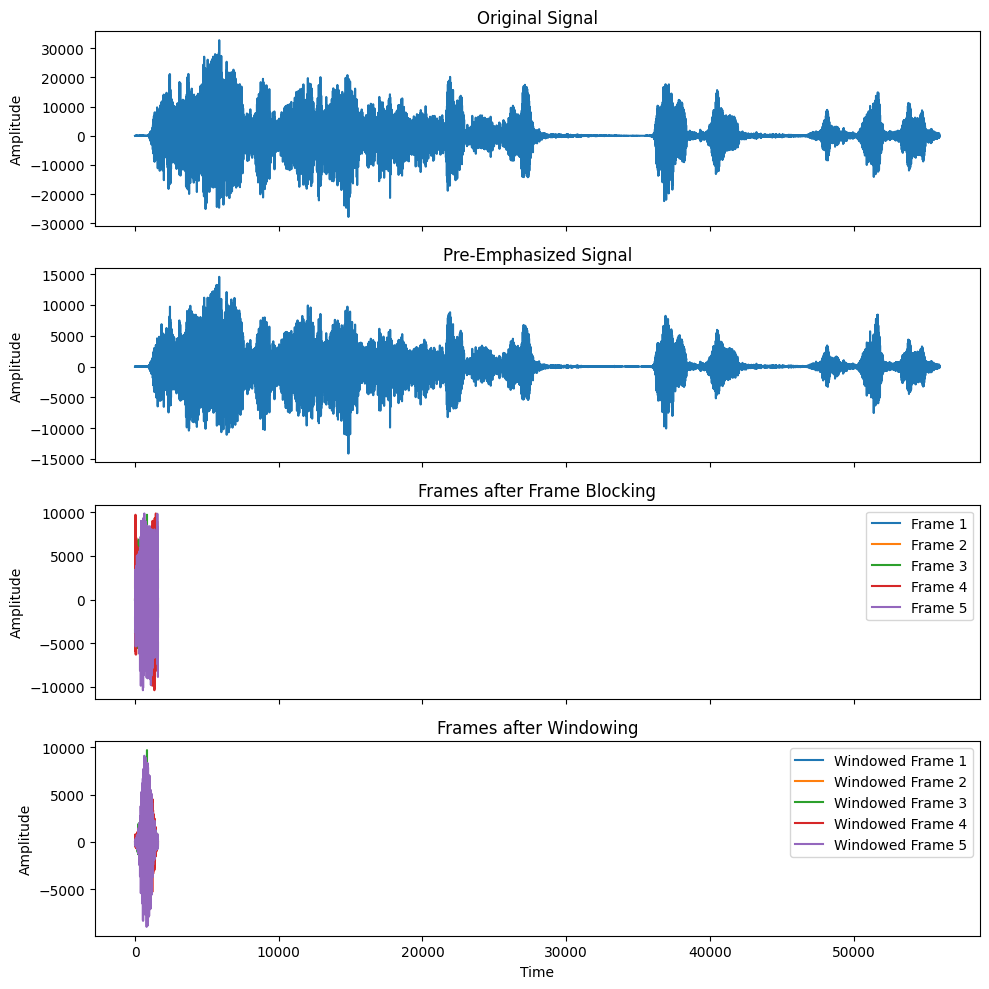

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

# Function to perform Pre-Emphasis on an audio signal
def apply_preemphasis(signal, pre_emphasis=0.67):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

# Function to perform frame blocking on an audio signal
def frame_blocking(signal, frame_duration=0.1, hop_duration=0.05, sample_rate=22050):
    frame_length = int(frame_duration * sample_rate)
    hop_length = int(hop_duration * sample_rate)
    frames = []
    for i in range(0, len(signal) - frame_length + 1, hop_length):
        frames.append(signal[i:i + frame_length])
    return np.array(frames)

# Function to apply windowing (Hamming window) to each frame
def apply_windowing(frames):
    windowed_frames = frames * np.hamming(frames.shape[1])
    return windowed_frames

# Read the audio file and consider the first 3.5 seconds
sample_rate, signal = wav.read('dog_barking_4.wav')
signal = signal[0:int(3.5 * sample_rate)]

# Apply Pre-Emphasis to the signal
preemphasized_signal = apply_preemphasis(signal)

# Perform Frame Blocking with frame duration of 0.1 seconds and hop duration of 0.05 seconds
frames = frame_blocking(preemphasized_signal, frame_duration=0.1, hop_duration=0.05, sample_rate=sample_rate)

# Apply Windowing to the frames (using Hamming window)
windowed_frames = apply_windowing(frames)

# Create a figure and subplots with shared x-axis
fig, axs = plt.subplots(4, 1, figsize=(10, 10), sharex=True)

# Plot original signal
axs[0].plot(signal)
axs[0].set_title('Original Signal')
axs[0].set_ylabel('Amplitude')

# Plot pre-emphasized signal
axs[1].plot(preemphasized_signal)
axs[1].set_title('Pre-Emphasized Signal')
axs[1].set_ylabel('Amplitude')

# Plot the first 5 frames after frame blocking
for i in range(5):
    axs[2].plot(frames[i], label=f'Frame {i + 1}')
axs[2].set_title('Frames after Frame Blocking')
axs[2].set_ylabel('Amplitude')
axs[2].legend()

# Plot the first 5 frames after windowing
for i in range(5):
    axs[3].plot(windowed_frames[i], label=f'Windowed Frame {i + 1}')
axs[3].set_title('Frames after Windowing')
axs[3].set_xlabel('Time')
axs[3].set_ylabel('Amplitude')
axs[3].legend()

# Display the plots
plt.tight_layout()
plt.show()


Frames after Frame Blocking:
Frame 1:
[-1.70000e+01 -1.61000e+00  3.71000e+00 ...  5.81860e+02 -5.27800e+01
 -1.95296e+03]

Frame 2:
[-1.31000e+00 -4.98000e+00 -2.97000e+00 ... -3.64342e+03 -2.41473e+03
 -6.21830e+02]

Frame 3:
[-3542.17 -3951.2  -3542.26 ...  2552.56  3515.87  1393.28]

Frame 4:
[ 1365.1   3189.17  4519.2  ... -6491.64 -3573.88    46.3 ]

Frame 5:
[-2089.18 -2535.32 -3738.33 ... -6049.52 -5785.84 -4979.83]

Frame 6:
[3178.92 6293.97 4717.23 ... 9549.33 9897.64 8046.94]

Frame 7:
[-5496.63 -5395.9  -5434.42 ...  3908.74  3155.63  2545.45]

Frame 8:
[ 6961.03  4099.47  2493.08 ... -5356.37 -3221.03  -937.76]

Frame 9:
[  -93.78 -1897.04 -1151.85 ...  2818.92  3347.86  1089.7 ]

Frame 10:
[  890.93  2609.72  4088.04 ... -2914.14 -3656.18 -5023.36]

Frame 11:
[ -285.79 -1343.41 -2915.72 ... -1410.09  -727.42  -335.25]

Frame 12:
[-5429.11 -4827.33 -4211.23 ... -2060.31  -257.2   2399.21]

Frame 13:
[ -323.23   626.4   1924.87 ... -2222.91 -3148.88 -3160.41]

Frame 14:
[ 4

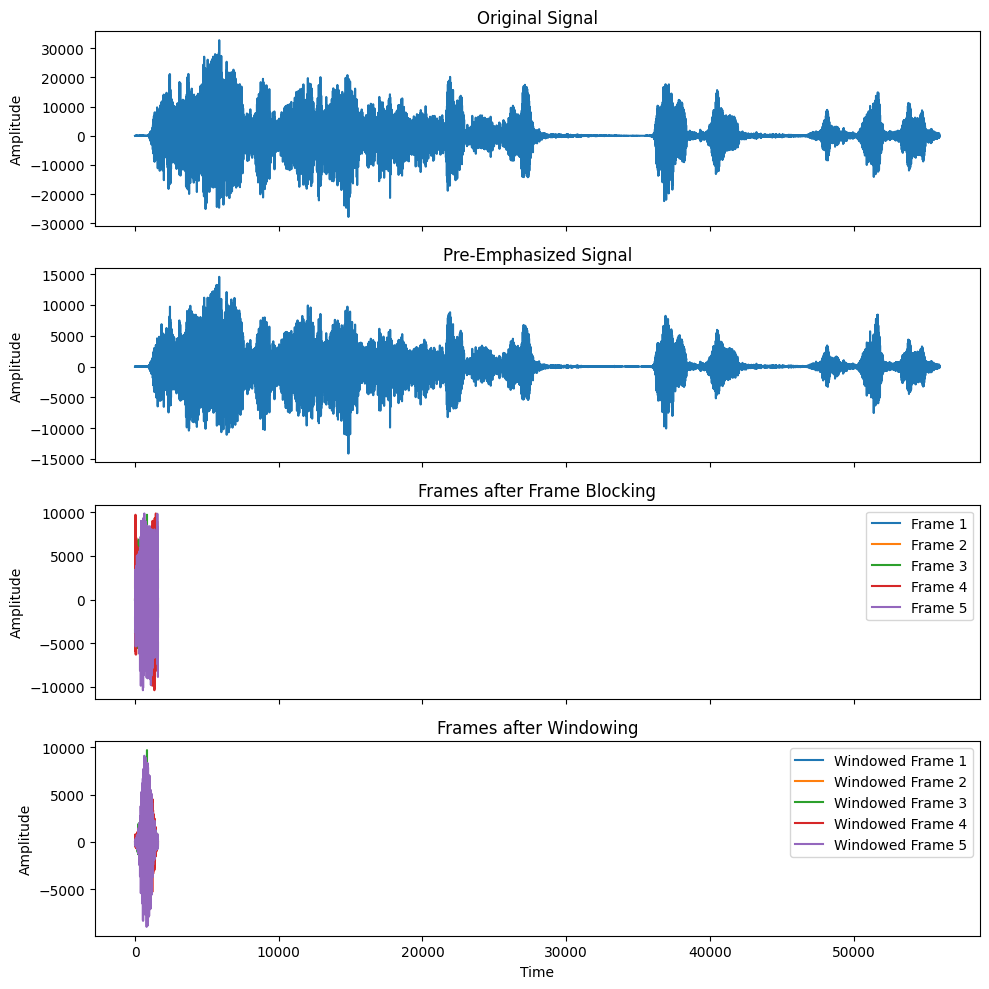

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

# Function to perform Pre-Emphasis on an audio signal
def apply_preemphasis(signal, pre_emphasis=0.67):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

# Function to perform frame blocking on an audio signal
def frame_blocking(signal, frame_duration=0.1, hop_duration=0.05, sample_rate=22050):
    frame_length = int(frame_duration * sample_rate)
    hop_length = int(hop_duration * sample_rate)
    frames = []
    for i in range(0, len(signal) - frame_length + 1, hop_length):
        frames.append(signal[i:i + frame_length])
    return np.array(frames)

# Function to apply windowing (Hamming window) to each frame
def apply_windowing(frames):
    windowed_frames = frames * np.hamming(frames.shape[1])
    return windowed_frames

# Read the audio file and consider the first 3.5 seconds
sample_rate, signal = wav.read('dog_barking_4.wav')
signal = signal[0:int(3.5 * sample_rate)]

# Apply Pre-Emphasis to the signal
preemphasized_signal = apply_preemphasis(signal)

# Perform Frame Blocking with frame duration of 0.1 seconds and hop duration of 0.05 seconds
frames = frame_blocking(preemphasized_signal, frame_duration=0.1, hop_duration=0.05, sample_rate=sample_rate)

# Apply Windowing to the frames (using Hamming window)
windowed_frames = apply_windowing(frames)

# Display the numerical values of the frames after frame blocking
print("Frames after Frame Blocking:")
for i in range(len(frames)):
    print(f"Frame {i + 1}:\n{frames[i]}")
    print()

# Display the numerical values of the windowed frames
print("Windowed Frames:")
for i in range(len(windowed_frames)):
    print(f"Windowed Frame {i + 1}:\n{windowed_frames[i]}")
    print()

# Create a figure and subplots with shared x-axis
fig, axs = plt.subplots(4, 1, figsize=(10, 10), sharex=True)

# Plot original signal
axs[0].plot(signal)
axs[0].set_title('Original Signal')
axs[0].set_ylabel('Amplitude')

# Plot pre-emphasized signal
axs[1].plot(preemphasized_signal)
axs[1].set_title('Pre-Emphasized Signal')
axs[1].set_ylabel('Amplitude')

# Plot the first 5 frames after frame blocking
for i in range(5):
    axs[2].plot(frames[i], label=f'Frame {i + 1}')
axs[2].set_title('Frames after Frame Blocking')
axs[2].set_ylabel('Amplitude')
axs[2].legend()

# Plot the first 5 frames after windowing
for i in range(5):
    axs[3].plot(windowed_frames[i], label=f'Windowed Frame {i + 1}')
axs[3].set_title('Frames after Windowing')
axs[3].set_xlabel('Time')
axs[3].set_ylabel('Amplitude')
axs[3].legend()

# Display the plots
plt.tight_layout()
plt.show()


Frames after Frame Blocking:
Frame 1:
[-1.70000e+01 -1.61000e+00  3.71000e+00 ...  5.81860e+02 -5.27800e+01
 -1.95296e+03]

Frame 2:
[-1.31000e+00 -4.98000e+00 -2.97000e+00 ... -3.64342e+03 -2.41473e+03
 -6.21830e+02]

Frame 3:
[-3542.17 -3951.2  -3542.26 ...  2552.56  3515.87  1393.28]

Frame 4:
[ 1365.1   3189.17  4519.2  ... -6491.64 -3573.88    46.3 ]

Frame 5:
[-2089.18 -2535.32 -3738.33 ... -6049.52 -5785.84 -4979.83]

Frame 6:
[3178.92 6293.97 4717.23 ... 9549.33 9897.64 8046.94]

Frame 7:
[-5496.63 -5395.9  -5434.42 ...  3908.74  3155.63  2545.45]

Frame 8:
[ 6961.03  4099.47  2493.08 ... -5356.37 -3221.03  -937.76]

Frame 9:
[  -93.78 -1897.04 -1151.85 ...  2818.92  3347.86  1089.7 ]

Frame 10:
[  890.93  2609.72  4088.04 ... -2914.14 -3656.18 -5023.36]

Frame 11:
[ -285.79 -1343.41 -2915.72 ... -1410.09  -727.42  -335.25]

Frame 12:
[-5429.11 -4827.33 -4211.23 ... -2060.31  -257.2   2399.21]

Frame 13:
[ -323.23   626.4   1924.87 ... -2222.91 -3148.88 -3160.41]

Frame 14:
[ 4

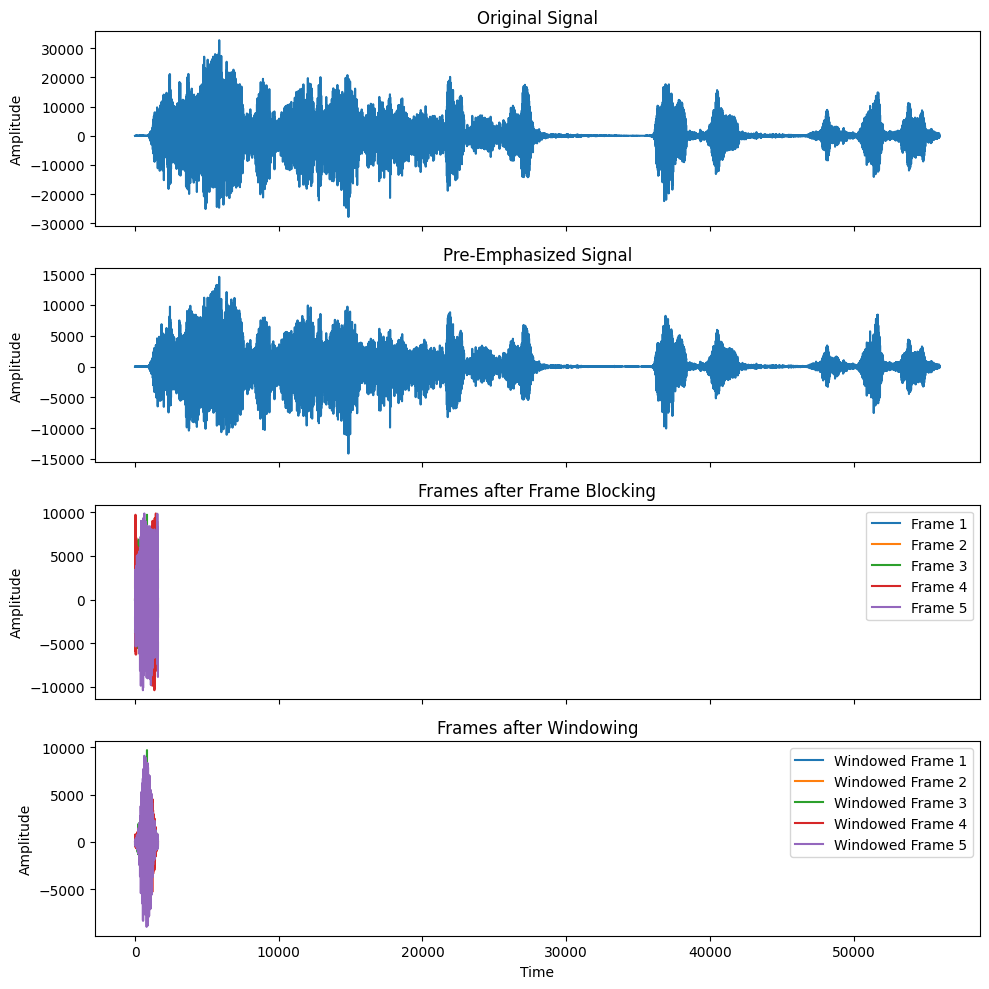

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

# Function to perform Pre-Emphasis on an audio signal
def apply_preemphasis(signal, pre_emphasis=0.67):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

# Function to perform frame blocking on an audio signal
def frame_blocking(signal, frame_duration=0.1, hop_duration=0.05, sample_rate=22050):
    frame_length = int(frame_duration * sample_rate)
    hop_length = int(hop_duration * sample_rate)
    frames = []
    for i in range(0, len(signal) - frame_length + 1, hop_length):
        frames.append(signal[i:i + frame_length])
    return np.array(frames)

# Function to apply windowing (Hamming window) to each frame
def apply_windowing(frames):
    windowed_frames = frames * np.hamming(frames.shape[1])
    return windowed_frames

# Read the audio file and consider the first 3.5 seconds
sample_rate, signal = wav.read('dog_barking_4.wav')
signal = signal[0:int(3.5 * sample_rate)]

# Apply Pre-Emphasis to the signal
preemphasized_signal = apply_preemphasis(signal)

# Perform Frame Blocking with frame duration of 0.1 seconds and hop duration of 0.05 seconds
frames = frame_blocking(preemphasized_signal, frame_duration=0.1, hop_duration=0.05, sample_rate=sample_rate)

# Apply Windowing to the frames (using Hamming window)
windowed_frames = apply_windowing(frames)

# Display the numerical values of the frames after frame blocking
print("Frames after Frame Blocking:")
for i in range(len(frames)):
    print(f"Frame {i + 1}:\n{frames[i]}")
    print()

# Display the numerical values of the windowed frames
print("Windowed Frames:")
for i in range(len(windowed_frames)):
    print(f"Windowed Frame {i + 1}:\n{windowed_frames[i]}")
    print()

# Create a figure and subplots with shared x-axis
fig, axs = plt.subplots(4, 1, figsize=(10, 10), sharex=True)

# Plot original signal
axs[0].plot(signal)
axs[0].set_title('Original Signal')
axs[0].set_ylabel('Amplitude')

# Plot pre-emphasized signal
axs[1].plot(preemphasized_signal)
axs[1].set_title('Pre-Emphasized Signal')
axs[1].set_ylabel('Amplitude')

# Plot the first 5 frames after frame blocking
for i in range(5):
    axs[2].plot(frames[i], label=f'Frame {i + 1}')
axs[2].set_title('Frames after Frame Blocking')
axs[2].set_ylabel('Amplitude')
axs[2].legend()

# Plot the first 5 frames after windowing
for i in range(5):
    axs[3].plot(windowed_frames[i], label=f'Windowed Frame {i + 1}')
axs[3].set_title('Frames after Windowing')
axs[3].set_xlabel('Time')
axs[3].set_ylabel('Amplitude')
axs[3].legend()

# Display the plots
plt.tight_layout()
plt.show()


# ***DATA 2***

In [ ]:
import numpy as np
import scipy.io.wavfile as wav

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    return frames

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for framing
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds

# Frame the audio signal
audio_frames = frame_audio(audio_data, sample_rate, frame_size, frame_stride)

# Print the frames
print("Audio Frames:")
print(audio_frames)
print("Shape of Frames:", audio_frames.shape)

# ***DATA 3***

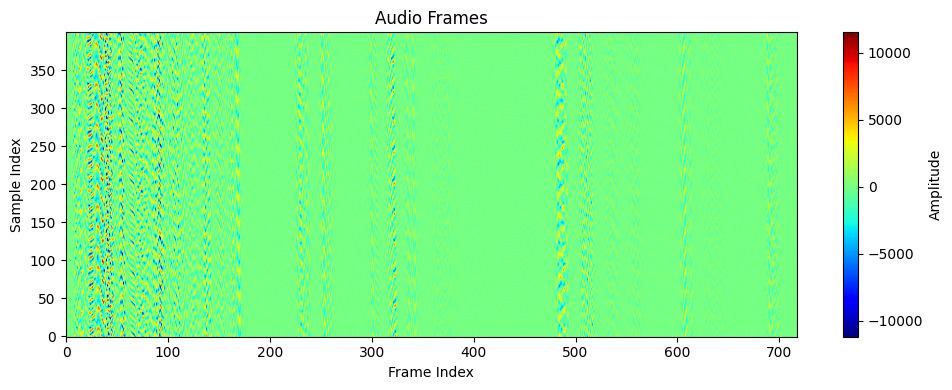

Audio Frames:
[[-1.36000000e+00  2.79399048e-01  6.10536003e-01 ...  3.38562672e-01
  -5.04359313e-02 -7.70400000e-01]
 [ 1.44720000e+00  2.10549999e-01 -7.46923809e-01 ... -7.77410496e-01
   3.20228135e-03 -2.34400000e-01]
 [ 1.03280000e+00 -5.60399237e-02 -8.60847742e-01 ... -1.15929635e+00
   1.70521482e-01  8.97600000e-01]
 ...
 [-1.76960000e+00 -3.84674048e+00 -4.15020072e+00 ...  3.66000689e+00
   3.66340987e+00  1.58960000e+00]
 [ 5.86400000e-01 -7.64544673e-01  8.50418086e-02 ...  3.69931867e+00
   3.15905056e+00  4.52560000e+00]
 [ 2.46400000e+00  3.18306767e+00  4.56979379e+00 ... -6.22008625e+00
  -6.35332621e+00 -4.57520000e+00]]
Shape of Frames: (718, 400)
Power Spectrum:
[[15.33656041 15.81915089 15.01861937 ...  7.23049451  1.76662032
   2.62366092]
 [19.38131347  7.31229558 12.22682653 ...  4.93673466  5.66961378
   0.3660124 ]
 [11.73752726  5.64660332  0.86016878 ...  1.97518974  3.96985677
   1.11681947]
 ...
 [23.09261751  3.91965914 30.46094337 ... 30.41815025 26.0

In [ ]:

import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    return frames

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for framing
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds

# Frame the audio signal
audio_frames = frame_audio(audio_data, sample_rate, frame_size, frame_stride)

# Visualize the frames
plt.figure(figsize=(10, 4))
plt.imshow(audio_frames.T, aspect='auto', origin='lower', cmap='jet')
plt.xlabel('Frame Index')
plt.ylabel('Sample Index')
plt.title('Audio Frames')
plt.colorbar(label='Amplitude')
plt.tight_layout()
plt.show()



def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    # Apply Hamming window to each frame
    frames *= np.hamming(frame_length)

    return frames

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for framing
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds

# Frame the audio signal and apply Hamming window
audio_frames = frame_audio(audio_data, sample_rate, frame_size, frame_stride)

# Print the frames
print("Audio Frames:")
print(audio_frames)
print("Shape of Frames:", audio_frames.shape)


def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    # Apply Hamming window to each frame
    frames *= np.hamming(frame_length)

    return frames

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for framing
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT

# Frame the audio signal and apply Hamming window
audio_frames = frame_audio(audio_data, sample_rate, frame_size, frame_stride)

# Calculate magnitude of FFT
mag_frames = np.absolute(np.fft.rfft(audio_frames, NFFT))

# Calculate power spectrum
pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

# Print the power spectrum
print("Power Spectrum:")
print(pow_frames)
print("Shape of Power Spectrum:", pow_frames.shape)

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    # Apply Hamming window to each frame
    frames *= np.hamming(frame_length)

    return frames

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for framing
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT

# Frame the audio signal and apply Hamming window
audio_frames = frame_audio(audio_data, sample_rate, frame_size, frame_stride)

# Calculate magnitude of FFT
mag_frames = np.absolute(np.fft.rfft(audio_frames, NFFT))

# Calculate power spectrum
pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

# Visualize the power spectrum
plt.figure(figsize=(10, 4))
plt.imshow(pow_frames.T, aspect='auto', origin='lower', cmap='jet')
plt.xlabel('Frame Index')
plt.ylabel('Frequency Bin')
plt.title('Power Spectrum')
plt.colorbar(label='Power')
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    # Apply Hamming window to each frame
    frames *= np.hamming(frame_length)

    return frames

def compute_mfcc(signal, sample_rate, frame_size, frame_stride, num_filters, num_ceps):
    # Frame the audio signal
    frames = frame_audio(signal, sample_rate, frame_size, frame_stride)

    # Calculate magnitude of FFT
    mag_frames = np.absolute(np.fft.rfft(frames, NFFT))

    # Calculate power spectrum
    pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

    # Mel filterbank
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))
    mel_points = np.linspace(low_freq_mel, high_freq_mel, num_filters + 2)
    hz_points = (700 * (10**(mel_points / 2595) - 1))
    bins = np.floor((NFFT + 1) * hz_points / sample_rate)

    filter_banks = np.zeros((num_filters, int(np.floor(NFFT / 2 + 1))))
    for m in range(1, num_filters + 1):
        f_m_minus = int(bins[m - 1])
        f_m = int(bins[m])
        f_m_plus = int(bins[m + 1])

        for k in range(f_m_minus, f_m):
            filter_banks[m - 1, k] = (k - bins[m - 1]) / (bins[m] - bins[m - 1])
        for k in range(f_m, f_m_plus):
            filter_banks[m - 1, k] = (bins[m + 1] - k) / (bins[m + 1] - bins[m])

    # Apply filterbank to power spectrum
    filter_banks = np.dot(pow_frames, filter_banks.T)
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks)
    filter_banks = 20 * np.log10(filter_banks)

    # Compute MFCC coefficients
    mfcc = dct(filter_banks, type=2, axis=1, norm='ortho')[:, :num_ceps]

    return mfcc

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for feature extraction
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT
num_filters = 40  # Number of mel filters
num_ceps = 12  # Number of MFCC coefficients

# Compute MFCC features
mfcc_features = compute_mfcc(audio_data, sample_rate, frame_size, frame_stride, num_filters, num_ceps)

# Print the MFCC features
print("MFCC Features:")
print(mfcc_features)
print("Shape of MFCC Features:", mfcc_features.shape)


import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    # Apply Hamming window to each frame
    frames *= np.hamming(frame_length)

    return frames

def compute_mfcc(signal, sample_rate, frame_size, frame_stride, num_filters, num_ceps):
    # Frame the audio signal
    frames = frame_audio(signal, sample_rate, frame_size, frame_stride)

    # Calculate magnitude of FFT
    mag_frames = np.absolute(np.fft.rfft(frames, NFFT))

    # Calculate power spectrum
    pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

    # Mel filterbank
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))
    mel_points = np.linspace(low_freq_mel, high_freq_mel, num_filters + 2)
    hz_points = (700 * (10**(mel_points / 2595) - 1))
    bins = np.floor((NFFT + 1) * hz_points / sample_rate)

    filter_banks = np.zeros((num_filters, int(np.floor(NFFT / 2 + 1))))
    for m in range(1, num_filters + 1):
        f_m_minus = int(bins[m - 1])
        f_m = int(bins[m])
        f_m_plus = int(bins[m + 1])

        for k in range(f_m_minus, f_m):
            filter_banks[m - 1, k] = (k - bins[m - 1]) / (bins[m] - bins[m - 1])
        for k in range(f_m, f_m_plus):
            filter_banks[m - 1, k] = (bins[m + 1] - k) / (bins[m + 1] - bins[m])

    # Apply filterbank to power spectrum
    filter_banks = np.dot(pow_frames, filter_banks.T)
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks)
    filter_banks = 20 * np.log10(filter_banks)

    # Compute MFCC coefficients
    mfcc = dct(filter_banks, type=2, axis=1, norm='ortho')[:, :num_ceps]

    return mfcc

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for feature extraction
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT
num_filters = 40  # Number of mel filters
num_ceps = 12  # Number of MFCC coefficients

# Compute MFCC features
mfcc_features = compute_mfcc(audio_data, sample_rate, frame_size, frame_stride, num_filters, num_ceps)

# Visualize the MFCC features
plt.figure(figsize=(10, 4))
plt.imshow(mfcc_features.T, aspect='auto', origin='lower', cmap='jet')
plt.xlabel('Frame Index')
plt.ylabel('MFCC Coefficient Index')
plt.title('MFCC Features')
plt.colorbar(label='MFCC Coefficient Value')
plt.tight_layout()
plt.show()




FileNotFoundError: ignored

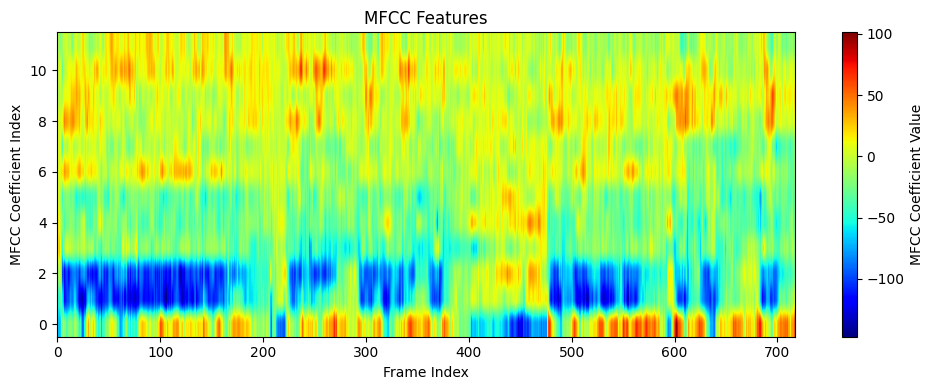

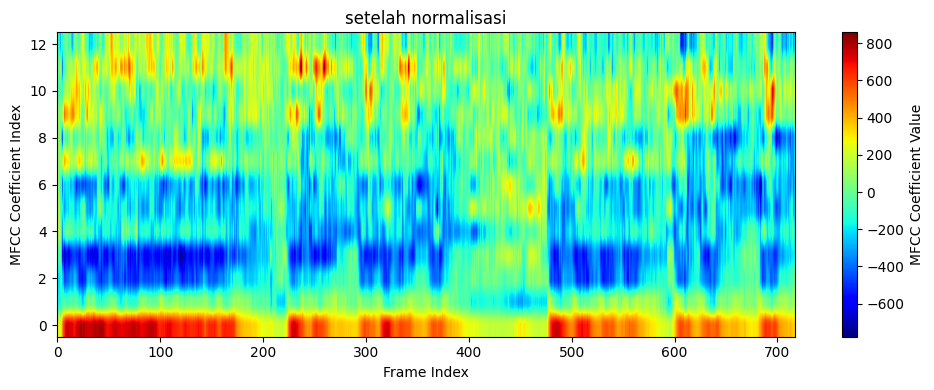

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt
from scipy.fftpack import dct

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    # Apply Hamming window to each frame
    frames *= np.hamming(frame_length)

    return frames

def compute_mfcc(signal, sample_rate, frame_size, frame_stride, num_filters, num_ceps):
    # Frame the audio signal
    frames = frame_audio(signal, sample_rate, frame_size, frame_stride)

    # Calculate magnitude of FFT
    mag_frames = np.absolute(np.fft.rfft(frames, NFFT))

    # Calculate power spectrum
    pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

    # Mel filterbank
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))
    mel_points = np.linspace(low_freq_mel, high_freq_mel, num_filters + 2)
    hz_points = (700 * (10**(mel_points / 2595) - 1))
    bins = np.floor((NFFT + 1) * hz_points / sample_rate)

    filter_banks = np.zeros((num_filters, int(np.floor(NFFT / 2 + 1))))
    for m in range(1, num_filters + 1):
        f_m_minus = int(bins[m - 1])
        f_m = int(bins[m])
        f_m_plus = int(bins[m + 1])

        for k in range(f_m_minus, f_m):
            filter_banks[m - 1, k] = (k - bins[m - 1]) / (bins[m] - bins[m - 1])
        for k in range(f_m, f_m_plus):
            filter_banks[m - 1, k] = (bins[m + 1] - k) / (bins[m + 1] - bins[m])

    # Apply filterbank to power spectrum
    filter_banks = np.dot(pow_frames, filter_banks.T)
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks)
    filter_banks = 20 * np.log10(filter_banks)

    # Compute MFCC coefficients
    mfcc = dct(filter_banks, type=2, axis=1, norm='ortho')[:, 1 : (num_ceps + 1)]

    return mfcc

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for feature extraction
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT
num_filters = 40  # Number of mel filters
num_ceps = 12  # Number of MFCC coefficients

# Compute MFCC features
mfcc_features = compute_mfcc(audio_data, sample_rate, frame_size, frame_stride, num_filters, num_ceps)

# Visualize the MFCC features
plt.figure(figsize=(10, 4))
plt.imshow(mfcc_features.T, aspect='auto', origin='lower', cmap='jet')
plt.xlabel('Frame Index')
plt.ylabel('MFCC Coefficient Index')
plt.title('MFCC Features')
plt.colorbar(label='MFCC Coefficient Value')
plt.tight_layout()
plt.show()
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt
from scipy.fftpack import dct

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    # Apply Hamming window to each frame
    frames *= np.hamming(frame_length)

    return frames

def compute_mfcc(signal, sample_rate, frame_size, frame_stride, num_filters, num_ceps, cep_lifter):
    # Frame the audio signal
    frames = frame_audio(signal, sample_rate, frame_size, frame_stride)

    # Calculate magnitude of FFT
    mag_frames = np.absolute(np.fft.rfft(frames, NFFT))

    # Calculate power spectrum
    pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

    # Mel filterbank
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))
    mel_points = np.linspace(low_freq_mel, high_freq_mel, num_filters + 2)
    hz_points = (700 * (10**(mel_points / 2595) - 1))
    bins = np.floor((NFFT + 1) * hz_points / sample_rate)

    filter_banks = np.zeros((num_filters, int(np.floor(NFFT / 2 + 1))))
    for m in range(1, num_filters + 1):
        f_m_minus = int(bins[m - 1])
        f_m = int(bins[m])
        f_m_plus = int(bins[m + 1])

        for k in range(f_m_minus, f_m):
            filter_banks[m - 1, k] = (k - bins[m - 1]) / (bins[m] - bins[m - 1])
        for k in range(f_m, f_m_plus):
            filter_banks[m - 1, k] = (bins[m + 1] - k) / (bins[m + 1] - bins[m])

    # Apply filterbank to power spectrum
    filter_banks = np.dot(pow_frames, filter_banks.T)
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks)
    filter_banks = 20 * np.log10(filter_banks)

    # Compute MFCC coefficients
    mfcc = dct(filter_banks, type=2, axis=1, norm='ortho')[:, :num_ceps]

    # Apply cepstral lifter
    (nframes, ncoeff) = mfcc.shape
    n = np.arange(ncoeff)
    lift = 1 + (cep_lifter / 2) * np.sin(np.pi * n / cep_lifter)
    mfcc *= lift

    return mfcc

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for feature extraction
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT
num_filters = 40  # Number of mel filters
num_ceps = 13  # Number of MFCC coefficients
cep_lifter = 22  # Cepstral lifter coefficient

# Compute MFCC features
mfcc_features = compute_mfcc(audio_data, sample_rate, frame_size, frame_stride, num_filters, num_ceps, cep_lifter)

# Visualize the MFCC features
plt.figure(figsize=(10, 4))
plt.imshow(mfcc_features.T, aspect='auto', origin='lower', cmap='jet')
plt.xlabel('Frame Index')
plt.ylabel('MFCC Coefficient Index')
plt.title('setelah normalisasi')
plt.colorbar(label='MFCC Coefficient Value')
plt.tight_layout()
plt.show()


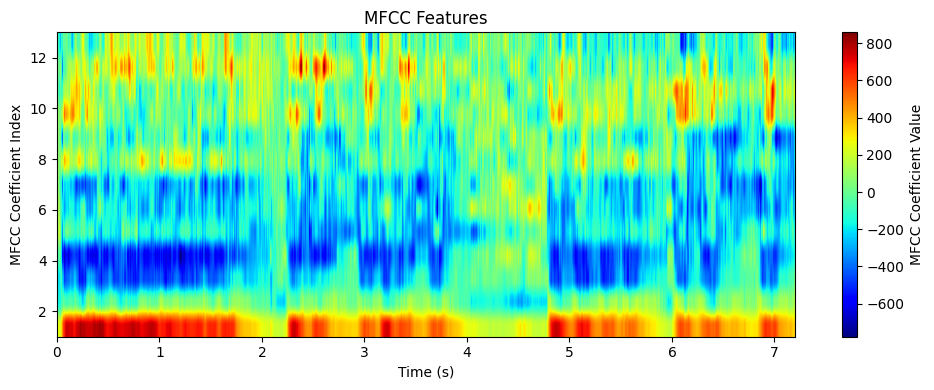

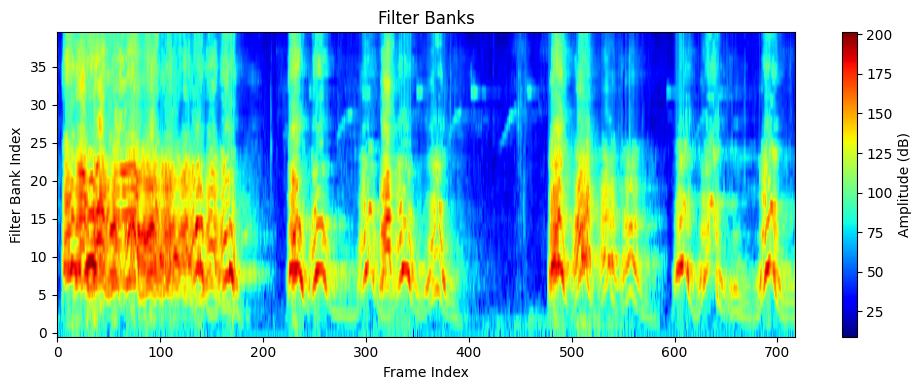

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt
from scipy.fftpack import dct

def apply_preemphasis(signal, pre_emphasis=0.97):
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])
    return emphasized_signal

def frame_audio(signal, sample_rate, frame_size, frame_stride):
    # Pre-emphasis
    emphasized_signal = apply_preemphasis(signal)

    # Convert from seconds to samples
    frame_length = int(round(frame_size * sample_rate))
    frame_step = int(round(frame_stride * sample_rate))

    # Calculate the number of frames
    signal_length = len(emphasized_signal)
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

    # Pad the signal to ensure all frames have equal number of samples
    pad_signal_length = num_frames * frame_step + frame_length
    pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))

    # Generate indices to extract frames
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T

    # Extract frames from the padded signal
    frames = pad_signal[indices.astype(np.int32, copy=False)]

    # Apply Hamming window to each frame
    frames *= np.hamming(frame_length)

    return frames

def compute_mfcc(signal, sample_rate, frame_size, frame_stride, num_filters, num_ceps, cep_lifter):
    # Frame the audio signal
    frames = frame_audio(signal, sample_rate, frame_size, frame_stride)

    # Calculate magnitude of FFT
    mag_frames = np.absolute(np.fft.rfft(frames, NFFT))

    # Calculate power spectrum
    pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

    # Mel filterbank
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))
    mel_points = np.linspace(low_freq_mel, high_freq_mel, num_filters + 2)
    hz_points = (700 * (10**(mel_points / 2595) - 1))
    bins = np.floor((NFFT + 1) * hz_points / sample_rate)

    filter_banks = np.zeros((num_filters, int(np.floor(NFFT / 2 + 1))))
    for m in range(1, num_filters + 1):
        f_m_minus = int(bins[m - 1])
        f_m = int(bins[m])
        f_m_plus = int(bins[m + 1])

        for k in range(f_m_minus, f_m):
            filter_banks[m - 1, k] = (k - bins[m - 1]) / (bins[m] - bins[m - 1])
        for k in range(f_m, f_m_plus):
            filter_banks[m - 1, k] = (bins[m + 1] - k) / (bins[m + 1] - bins[m])

    # Apply filterbank to power spectrum
    filter_banks = np.dot(pow_frames, filter_banks.T)
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks)
    filter_banks = 20 * np.log10(filter_banks)

    # Compute MFCC coefficients
    mfcc = dct(filter_banks, type=2, axis=1, norm='ortho')[:, :num_ceps]

    # Apply cepstral lifter
    (nframes, ncoeff) = mfcc.shape
    n = np.arange(ncoeff)
    lift = 1 + (cep_lifter / 2) * np.sin(np.pi * n / cep_lifter)
    mfcc *= lift

    return mfcc

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for feature extraction
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT
num_filters = 40  # Number of mel filters
num_ceps = 13  # Number of MFCC coefficients
cep_lifter = 22  # Cepstral lifter coefficient

# Compute MFCC features
mfcc_features = compute_mfcc(audio_data, sample_rate, frame_size, frame_stride, num_filters, num_ceps, cep_lifter)

# Calculate time axis
frame_length_samples = int(frame_size * sample_rate)
frame_step_samples = int(frame_stride * sample_rate)
total_duration = len(audio_data) / sample_rate
time_axis = np.linspace(0, total_duration, num=mfcc_features.shape[0])

# Visualize the MFCC features
plt.figure(figsize=(10, 4))
plt.imshow(mfcc_features.T, aspect='auto', origin='lower', cmap='jet', extent=[time_axis[0], time_axis[-1], 1, num_ceps])
plt.xlabel('Time (s)')
plt.ylabel('MFCC Coefficient Index')
plt.title('MFCC Features')
plt.colorbar(label='MFCC Coefficient Value')
plt.tight_layout()
plt.show()

import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

def compute_filter_banks(pow_frames, sample_rate, nfilt, NFFT):
    # Convert Hz to Mel
    low_freq_mel = 0
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))

    # Equally spaced points in Mel scale
    mel_points = np.linspace(low_freq_mel, high_freq_mel, nfilt + 2)

    # Convert Mel to Hz
    hz_points = (700 * (10**(mel_points / 2595) - 1))

    # Convert Hz to bins
    bins = np.floor((NFFT + 1) * hz_points / sample_rate)

    # Initialize filter bank
    filter_banks = np.zeros((nfilt, int(np.floor(NFFT / 2 + 1))))

    # Populate filter bank
    for m in range(1, nfilt + 1):
        f_m_minus = int(bins[m - 1])   # left
        f_m = int(bins[m])             # center
        f_m_plus = int(bins[m + 1])    # right

        for k in range(f_m_minus, f_m):
            filter_banks[m - 1, k] = (k - bins[m - 1]) / (bins[m] - bins[m - 1])
        for k in range(f_m, f_m_plus):
            filter_banks[m - 1, k] = (bins[m + 1] - k) / (bins[m + 1] - bins[m])

    # Apply filter bank to power spectrum
    filter_banks = np.dot(pow_frames, filter_banks.T)

    # Numerical stability
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks)

    # Convert to dB
    filter_banks = 20 * np.log10(filter_banks)

    return filter_banks

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for feature extraction
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT
num_filters = 40  # Number of mel filters

# Preprocessing
emphasized_signal = audio_data
frame_length = int(round(frame_size * sample_rate))
frame_step = int(round(frame_stride * sample_rate))
signal_length = len(emphasized_signal)
num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))
pad_signal_length = num_frames * frame_step + frame_length
pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))
indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
frames = pad_signal[indices.astype(np.int32, copy=False)]
frames *= np.hamming(frame_length)

# Calculate magnitude of FFT
mag_frames = np.absolute(np.fft.rfft(frames, NFFT))
pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

# Compute filter banks
filter_banks = compute_filter_banks(pow_frames, sample_rate, num_filters, NFFT)

# Visualize filter banks
plt.figure(figsize=(10, 4))
plt.imshow(filter_banks.T, aspect='auto', origin='lower', cmap='jet')
plt.xlabel('Frame Index')
plt.ylabel('Filter Bank Index')
plt.title('Filter Banks')
plt.colorbar(label='Amplitude (dB)')
plt.tight_layout()
plt.show()




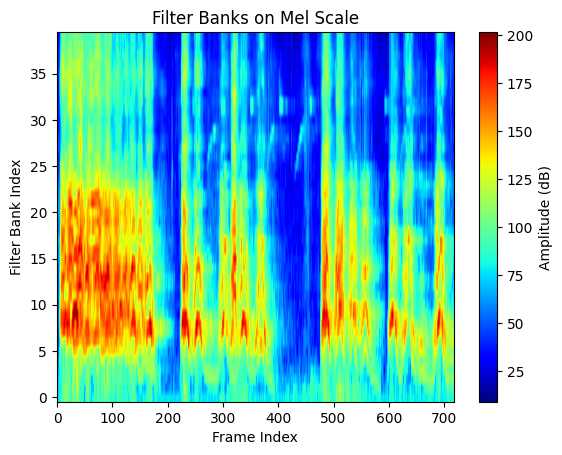

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

def compute_filter_banks(pow_frames, sample_rate, nfilt, NFFT):
    # Convert Hz to Mel
    low_freq_mel = 16
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))
    mel_points = np.linspace(low_freq_mel, high_freq_mel, nfilt + 2)
    hz_points = (700 * (10**(mel_points / 2595) - 1))
    bins = np.floor((NFFT + 1) * hz_points / sample_rate)

    # Initialize filter bank
    fbank = np.zeros((nfilt, int(np.floor(NFFT / 2 + 1))))

    # Populate filter bank
    for m in range(1, nfilt + 1):
        f_m_minus = int(bins[m - 1])   # left
        f_m = int(bins[m])             # center
        f_m_plus = int(bins[m + 1])    # right

        for k in range(f_m_minus, f_m):
            fbank[m - 1, k] = (k - bins[m - 1]) / (bins[m] - bins[m - 1])
        for k in range(f_m, f_m_plus):
            fbank[m - 1, k] = (bins[m + 1] - k) / (bins[m + 1] - bins[m])

    # Apply filter bank to power spectrum
    filter_banks = np.dot(pow_frames, fbank.T)

    # Numerical stability
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks)

    # Convert to dB
    filter_banks = 20 * np.log10(filter_banks)

    return filter_banks

# Load audio file
sample_rate, audio_data = wav.read('dog_barking_4.wav')

# Parameters for feature extraction
frame_size = 0.025  # 25 milliseconds
frame_stride = 0.01  # 10 milliseconds
NFFT = 512  # Number of points for FFT
num_filters = 40  # Number of mel filters

# Preprocessing
emphasized_signal = audio_data
frame_length = int(round(frame_size * sample_rate))
frame_step = int(round(frame_stride * sample_rate))
signal_length = len(emphasized_signal)
num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))
pad_signal_length = num_frames * frame_step + frame_length
pad_signal = np.append(emphasized_signal, np.zeros((pad_signal_length - signal_length)))
indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
frames = pad_signal[indices.astype(np.int32, copy=False)]
frames *= np.hamming(frame_length)

# Calculate magnitude of FFT
mag_frames = np.absolute(np.fft.rfft(frames, NFFT))
pow_frames = (1.0 / NFFT) * (mag_frames ** 2)

# Compute filter banks
filter_banks = compute_filter_banks(pow_frames, sample_rate, num_filters, NFFT)

# Visualize filter banks
plt.imshow(filter_banks.T, aspect='auto', origin='lower', cmap='jet')
plt.colorbar(label='Amplitude (dB)')
plt.xlabel('Frame Index')
plt.ylabel('Filter Bank Index')
plt.title('Filter Banks on Mel Scale')
plt.show()


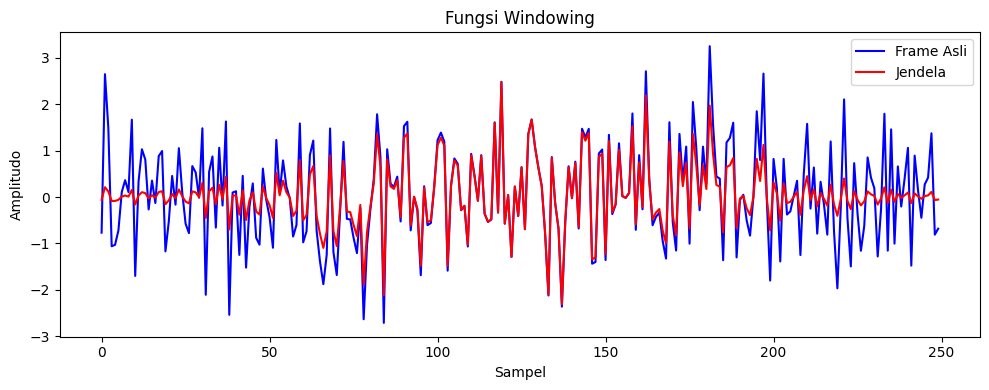

In [ ]:
def apply_window(frames, window_type):
    window = np.zeros_like(frames)
    if window_type == 'hamming':
        window = np.hamming(frames.shape[1])
    elif window_type == 'hanning':
        window = np.hanning(frames.shape[1])
    elif window_type == 'blackman':
        window = np.blackman(frames.shape[1])
    elif window_type == 'rectangular':
        window = np.ones(frames.shape[1])
    else:
        raise ValueError("Jenis jendela tidak valid.")

    return frames * window
frames = np.random.randn(4, 250)  # frame-frame audio
window_type = 'hamming'

windowed_frames = apply_window(frames, window_type)

plt.figure(figsize=(10, 4))
plt.plot(frames[0], color='b', label='Frame Asli')
plt.plot(windowed_frames[0], color='r', label='Jendela')
plt.title('Fungsi Windowing')
plt.xlabel('Sampel')
plt.ylabel('Amplitudo')
plt.legend()
plt.tight_layout()
plt.show()